# 🤖 Lab: ManiSkill — GPU Parallelized Robotics Simulation

## วัตถุประสงค์ของแลป
1. เข้าใจหลักการทำงานของ ManiSkill3 ซึ่งเป็น robotics simulator ที่รองรับ GPU parallelization
2. สามารถสร้างและรัน environment ต่างๆ ได้หลากหลายประเภท
3. เข้าใจ observation modes, control modes และการ render ภาพจาก simulation
4. สามารถบันทึกวิดีโอและ visualize ผลลัพธ์จาก environment ต่างๆ ได้

## ManiSkill3 คืออะไร?
ManiSkill3 เป็น open-source GPU parallelized robotics simulator พัฒนาโดย Hillbot, Inc.
- **GPU Parallelized Simulation + Rendering** — FPS สูงถึง 30,000+ บน GPU เดียว
- **Heterogeneous Simulation** — จำลองวัตถุที่แตกต่างกันในแต่ละ parallel environment
- **หลากหลาย Robot Embodiments** — Humanoids, mobile manipulators, single-arm robots
- **รองรับ Gymnasium API** — ใช้งานร่วมกับ RL/IL framework ได้ง่าย

---
## ส่วนที่ 1: การติดตั้ง (Installation)

In [1]:
# ติดตั้ง ManiSkill3 และ dependencies ที่จำเป็น
#!uv pip install mani-skill gymnasium torch mediapy imageio[ffmpeg] Pillow matplotlib -q

In [2]:
# Import libraries หลัก
import gymnasium as gym
import mani_skill.envs          # ← สำคัญ! register ทุก environment
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display
import time
import warnings
import subprocess, os, sys

warnings.filterwarnings("ignore")

print(f"✅ PyTorch  : {torch.__version__}")
print(f"✅ CUDA     : {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"   GPU      : {torch.cuda.get_device_name(0)}")

✅ PyTorch  : 2.10.0+cu130
✅ CUDA     : True
   GPU      : NVIDIA GeForce RTX 5090


---
## ส่วนที่ 2: สำรวจ Environments ที่มีให้ใช้งาน

| หมวดหมู่ | ตัวอย่าง env_id | คำอธิบาย |
|---|---|---|
| **Table-Top Gripper** | PickCube-v1, PushCube-v1, StackCube-v1 | manipulation บนโต๊ะ |
| **Peg / Plug** | PegInsertionSide-v1, PlugCharger-v1 | เสียบ/ประกอบชิ้นส่วน |
| **YCB Objects** | PickSingleYCB-v1, PickClutterYCB-v1 | หยิบวัตถุ YCB จริง |
| **Mobile Manipulation** | OpenCabinetDrawer-v1, OpenCabinetDoor-v1 | หุ่นยนต์เปิดตู้ |
| **Control / Locomotion** | MS-CartpoleBalance-v1, MS-CartpoleSwingUp-v1, MS-HopperHop-v1 | classic control |
| **Humanoid** | UnitreeG1PlaceAppleInBowl-v1 | หุ่นยนต์ humanoid วางผลไม้ |
| **Drawing** | DrawTriangle-v1, DrawSVG-v1 | วาดรูปด้วยหุ่นยนต์ |

In [3]:
# แสดงรายชื่อ environments ทั้งหมด
from mani_skill.utils.registration import REGISTERED_ENVS

env_list = sorted(REGISTERED_ENVS.keys())
print(f"📋 จำนวน environments ทั้งหมด: {len(env_list)}\n")

# จัดกลุ่มตามคำที่พบในชื่อ
categories = {
    "Cube / Table-Top": [],
    "Peg / Plug / Insert": [],
    "YCB": [],
    "Cabinet / Door": [],
    "Cartpole / Control": [],
    "Locomotion": [],
    "Humanoid": [],
    "Draw": [],
    "Other": [],
}

for eid in env_list:
    name_lower = eid.lower()
    if any(k in name_lower for k in ["cube", "push", "pick", "stack", "lift"]):
        categories["Cube / Table-Top"].append(eid)
    elif any(k in name_lower for k in ["peg", "plug", "insert"]):
        categories["Peg / Plug / Insert"].append(eid)
    elif "ycb" in name_lower:
        categories["YCB"].append(eid)
    elif any(k in name_lower for k in ["cabinet", "door", "faucet"]):
        categories["Cabinet / Door"].append(eid)
    elif "cartpole" in name_lower:
        categories["Cartpole / Control"].append(eid)
    elif any(k in name_lower for k in ["hopper", "ant", "walk", "run", "stand"]):
        categories["Locomotion"].append(eid)
    elif any(k in name_lower for k in ["humanoid", "unitree", "g1"]):
        categories["Humanoid"].append(eid)
    elif "draw" in name_lower:
        categories["Draw"].append(eid)
    else:
        categories["Other"].append(eid)

for cat, envs in categories.items():
    if envs:
        print(f"  📁 {cat} ({len(envs)})")
        for e in envs[:30]:
            print(f"      • {e}")
        if len(envs) > 30:
            print(f"      ... และอีก {len(envs)-8} environments")
        print()

📋 จำนวน environments ทั้งหมด: 74

  📁 Cube / Table-Top (22)
      • LiftPegUpright-v1
      • PickClutterYCB-v1
      • PickCube-v1
      • PickCubeSO100-v1
      • PickCubeWidowXAI-v1
      • PickSingleYCB-v1
      • PokeCube-v1
      • PullCube-v1
      • PullCubeTool-v1
      • PushCube-v1
      • PushT-v1
      • SO100GraspCube-v1
      • StackCube-v1
      • StackGreenCubeOnYellowCubeBakedTexInScene-v1
      • StackPyramid-v1
      • TriFingerRotateCubeLevel0-v1
      • TriFingerRotateCubeLevel1-v1
      • TriFingerRotateCubeLevel2-v1
      • TriFingerRotateCubeLevel3-v1
      • TriFingerRotateCubeLevel4-v1
      • TwoRobotPickCube-v1
      • TwoRobotStackCube-v1

  📁 Peg / Plug / Insert (3)
      • InsertFlower-v1
      • PegInsertionSide-v1
      • PlugCharger-v1

  📁 Cabinet / Door (3)
      • OpenCabinetDoor-v1
      • OpenCabinetDrawer-v1
      • TurnFaucet-v1

  📁 Cartpole / Control (2)
      • MS-CartpoleBalance-v1
      • MS-CartpoleSwingUp-v1

  📁 Locomotion (10)
      • 

---
## ส่วนที่ 3: Helper Functions สำหรับ Render และแสดงผล

เนื่องจากใน Jupyter Notebook ไม่สามารถเปิด GUI ได้โดยตรง
เราจึงใช้ `render_mode="rgb_array"` เพื่อเก็บภาพเป็น array แล้วแสดงผลด้วย PIL / mediapy

### อธิบาย Helper Functions

**`make_env(env_id, obs_mode, control_mode)`**
- สร้าง environment แบบ single-env CPU mode
- ใช้ `CPUGymWrapper` เพื่อแปลง GPU tensor → numpy array (ใช้งานง่าย)
- `render_mode="rgb_array"` → render เป็น numpy array แทน GUI window

**`render_frame(env)` → PIL Image**
- เรียก `env.render()` → ได้ numpy array (H, W, 3)
- แปลงเป็น PIL Image สำหรับแสดงใน notebook

**`run_and_collect(env, n_steps)` → frames, rewards, observations**
- รัน **random policy** (สุ่ม action ทุก step)
- เก็บ frames สำหรับทำวิดีโอ + rewards สำหรับ plot กราฟ
- ใช้ `env.action_space.sample()` เพื่อสุ่ม action

**`show_video(frames, fps)` / `show_grid(images)`**
- แสดงวิดีโอหรือ grid ของรูปภาพใน Jupyter notebook

**ทำไมใช้ Random Policy?**
- เพื่อดูว่า environment ทำงานอย่างไร **โดยไม่ต้อง train** model
- Random policy = สุ่ม action → ดูว่า reward เป็นอย่างไรเมื่อไม่มี intelligence
- เป็น **baseline** สำหรับเปรียบเทียบกับ trained policy ในอนาคต

In [4]:
from mani_skill.utils.wrappers.gymnasium import CPUGymWrapper
import mediapy as media


def make_env(env_id, obs_mode="state", control_mode=None, **kwargs):
    """สร้าง environment แบบ single-env CPU mode (เหมาะกับการเรียนรู้)"""
    make_kwargs = dict(
        num_envs=1,
        obs_mode=obs_mode,
        render_mode="rgb_array",
    )
    if control_mode is not None:
        make_kwargs["control_mode"] = control_mode
    make_kwargs.update(kwargs)
    env = gym.make(env_id, **make_kwargs)
    env = CPUGymWrapper(env)
    return env


def to_uint8(frame):
    """แปลง frame เป็น uint8 numpy array อย่างปลอดภัย"""
    if isinstance(frame, torch.Tensor):
        frame = frame.cpu().numpy()
    if frame.ndim == 4:
        frame = frame[0]
    if frame.dtype == np.float32 or frame.dtype == np.float64:
        frame = (frame * 255).clip(0, 255).astype(np.uint8)
    return frame


def render_frame(env, width=512, height=512):
    """Render เฟรมปัจจุบันจาก environment แล้วคืนเป็น PIL Image"""
    frame = env.render()
    frame = to_uint8(frame)
    img = Image.fromarray(frame)
    return img.resize((width, height))


def run_random_policy(env, n_steps=100, render_every=1):
    """รัน random policy แล้วเก็บ frames สำหรับทำวิดีโอ"""
    frames = []
    obs, info = env.reset()

    frame = to_uint8(env.render())
    frames.append(frame)

    for step in range(n_steps):
        action = env.action_space.sample()
        obs, reward, terminated, truncated, info = env.step(action)

        if step % render_every == 0:
            frame = to_uint8(env.render())
            frames.append(frame)

        if terminated or truncated:
            obs, info = env.reset()

    return frames


def run_and_collect(env, n_steps=200):
    """รัน random policy แล้วเก็บ frames + rewards + info"""
    frames, rewards, all_obs = [], [], []
    obs, info = env.reset()
    all_obs.append(obs.copy() if isinstance(obs, np.ndarray) else obs)
    frames.append(to_uint8(env.render()))

    for step in range(n_steps):
        action = env.action_space.sample()
        obs, reward, terminated, truncated, info = env.step(action)
        rewards.append(float(reward) if np.isscalar(reward) else float(reward))
        all_obs.append(obs.copy() if isinstance(obs, np.ndarray) else obs)
        frames.append(to_uint8(env.render()))

        if terminated or truncated:
            obs, info = env.reset()

    return frames, rewards, all_obs


def show_video(frames, fps=20):
    """แสดงวิดีโอจาก list ของ frames ใน notebook"""
    media.show_video(frames, fps=fps)


def show_grid(images, titles=None, cols=3, figsize=(15, 10)):
    """แสดง grid ของรูปภาพ (titles เป็น English เพราะ matplotlib ไม่รองรับ Thai)"""
    rows = (len(images) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    if rows * cols == 1:
        axes = np.array([axes])
    axes = np.array(axes).reshape(-1)
    for i, ax in enumerate(axes):
        if i < len(images):
            ax.imshow(images[i])
            if titles:
                ax.set_title(titles[i], fontsize=11, fontweight="bold")
        ax.axis("off")
    plt.tight_layout()
    plt.show()


def download_asset(env_id):
    """Download assets สำหรับ environment ที่ต้องการ"""
    result = subprocess.run(
        ["python", "-m", "mani_skill.utils.download_asset", env_id],
        capture_output=True, timeout=120,
    )
    return result.returncode == 0


print("✅ Helper functions พร้อมใช้งาน")

✅ Helper functions พร้อมใช้งาน


---
## ส่วนที่ 4: ตัวอย่างที่ 1 — PushCube (ผลักลูกบาศก์)

**PushCube-v1** เป็น environment พื้นฐานที่สุด:
แขนกล Panda ต้องผลัก cube ไปยังตำแหน่งเป้าหมาย

In [5]:
# 4.1 สร้าง PushCube environment และ render ภาพเริ่มต้น
env = make_env("PushCube-v1", obs_mode="state", control_mode="pd_ee_delta_pose")
obs, info = env.reset(seed=42)

print("=" * 55)
print("  PushCube-v1 Environment Info")
print("=" * 55)
print(f"  Observation space : {env.observation_space.shape}")
print(f"  Action space      : {env.action_space.shape}")
print(f"  Obs sample (first 5): {obs[:5].round(4)}")
print("=" * 55)

  PushCube-v1 Environment Info
  Observation space : (35,)
  Action space      : (7,)
  Obs sample (first 5): [ 0.0099  0.3899  0.013  -1.933  -0.0047]


### อธิบาย Environment ทีละส่วน

**Observation Space** — `env.observation_space.shape → (25,)`

State vector ของ PushCube ประกอบด้วย:
```
[ joint_positions (7)      ← มุมของข้อต่อหุ่นยนต์ทั้ง 7 ข้อ
  joint_velocities (7)     ← ความเร็วของข้อต่อ
  gripper_state (2)        ← สถานะของนิ้วจับ (เปิด/ปิดแค่ไหน)
  ee_pose (7)              ← ตำแหน่ง + orientation ของมือหุ่นยนต์
  cube_position (3)        ← x, y, z ของก้อนบาศก์
  cube_orientation (4)     ← quaternion ของก้อนบาศก์
  goal_position (3)        ← ตำแหน่งเป้าหมาย
  ... ]
```

**Action Space** — `env.action_space.shape → (7,)`

เนื่องจากใช้ `pd_ee_delta_pose` action vector มี **7 มิติ**:
```
action = [ dx, dy, dz,         ← เคลื่อนมือไปทิศทาง x, y, z
           droll, dpitch, dyaw, ← หมุนมือ
           gripper ]            ← เปิด/ปิดนิ้วจับ
```

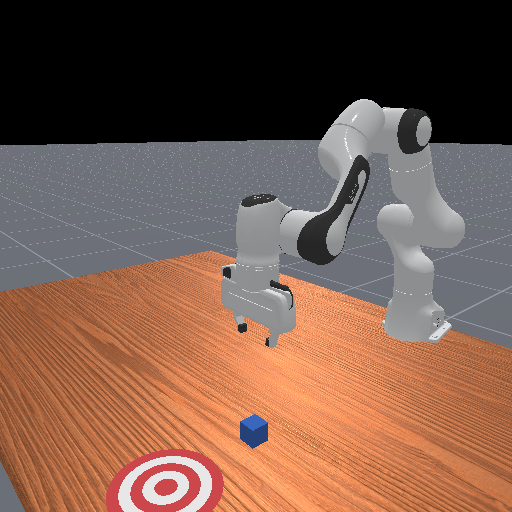

In [6]:
img = render_frame(env)
display(img)

🎬 Collected 101 frames, 100 rewards


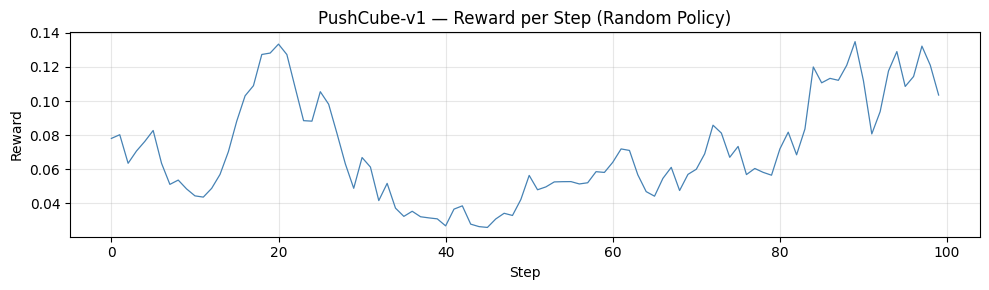

  Total reward : 7.0820
  Mean reward  : 0.0708


In [7]:
# 4.2 รัน random policy บน PushCube แล้วเก็บ frames + rewards
frames, rewards, _ = run_and_collect(env, n_steps=100)
print(f"🎬 Collected {len(frames)} frames, {len(rewards)} rewards")
show_video(frames, fps=20)

# 4.3 Plot reward curve
fig, ax = plt.subplots(figsize=(10, 3))
ax.plot(rewards, linewidth=0.9, color="steelblue")
ax.set_xlabel("Step")
ax.set_ylabel("Reward")
ax.set_title("PushCube-v1 — Reward per Step (Random Policy)")
ax.grid(True, alpha=0.3)
fig.tight_layout()
plt.show()

print(f"  Total reward : {sum(rewards):.4f}")
print(f"  Mean reward  : {np.mean(rewards):.4f}")
env.close()

---
## ส่วนที่ 5: ตัวอย่างที่ 2 — PickCube (หยิบลูกบาศก์)

**PickCube-v1**: แขนกล Panda ต้องหยิบ cube แล้วยกขึ้นไปยังตำแหน่งเป้าหมาย
เป็นงานที่ยากกว่า PushCube เพราะต้องจับและยก

### อธิบาย Environment

**ความแตกต่างจาก PushCube:**
- ต้อง **จับ (grasp)** วัตถุด้วย gripper ก่อน → gripper action สำคัญมาก
- ต้อง **ยก (lift)** วัตถุขึ้นไปยังตำแหน่งเป้าหมายใน 3D → ต้องควบคุมแกน z ด้วย
- Reward function จะวัดทั้ง **ระยะห่างจาก cube** และ **ระยะห่างจาก goal**

**Observation Space** — `env.observation_space.shape → (25,)` (คล้าย PushCube)
```
[ joint_positions (7)      ← มุมของข้อต่อหุ่นยนต์
  joint_velocities (7)     ← ความเร็วของข้อต่อ
  gripper_state (2)        ← สถานะนิ้วจับ (สำคัญมากสำหรับ pick)
  cube_position (3)        ← ตำแหน่ง cube ที่ต้องหยิบ
  goal_position (3)        ← ตำแหน่งเป้าหมายที่ต้องยกไปวาง
  ... ]
```

**Action Space** — `env.action_space.shape → (7,)` เหมือน PushCube
```
action = [ dx, dy, dz,         ← เคลื่อนมือ (ต้องยกขึ้นด้วย = dz > 0)
           droll, dpitch, dyaw, ← หมุนมือ
           gripper ]            ← **ค่าบวก = ปิดนิ้วจับ (grasp), ค่าลบ = เปิด**
```

  Observation space : (42,)
  Action space      : (7,)


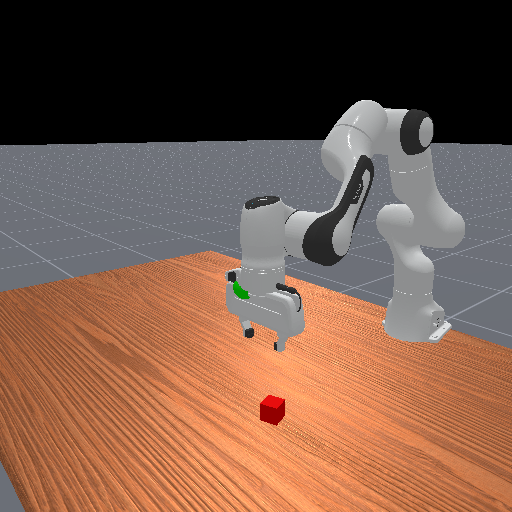

In [8]:
env = make_env("PickCube-v1", obs_mode="state", control_mode="pd_ee_delta_pose")
obs, info = env.reset(seed=0)

print(f"  Observation space : {env.observation_space.shape}")
print(f"  Action space      : {env.action_space.shape}")

img = render_frame(env)
display(img)

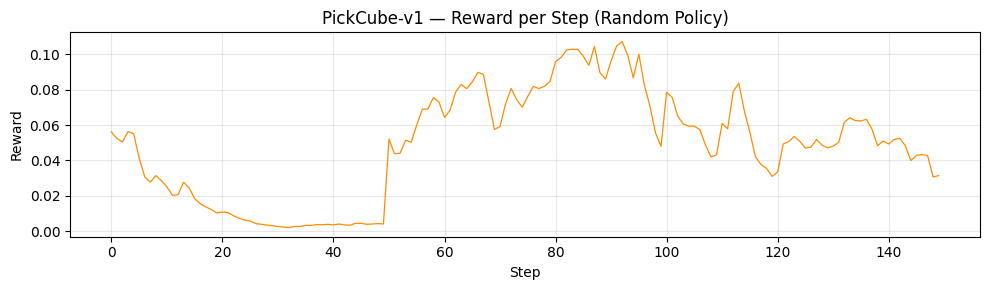

In [9]:
frames, rewards_pick, _ = run_and_collect(env, n_steps=150)
show_video(frames, fps=20)

fig, ax = plt.subplots(figsize=(10, 3))
ax.plot(rewards_pick, linewidth=0.9, color="darkorange")
ax.set_xlabel("Step")
ax.set_ylabel("Reward")
ax.set_title("PickCube-v1 — Reward per Step (Random Policy)")
ax.grid(True, alpha=0.3)
fig.tight_layout()
plt.show()
env.close()

---
## ส่วนที่ 6: ตัวอย่างที่ 3 — StackCube (วางลูกบาศก์ซ้อนกัน)

**StackCube-v1**: แขนกลต้องหยิบ cube สีแดงแล้ววางซ้อนบน cube สีเขียว
ต้องการทั้ง pick, place, และ precision

### อธิบาย Environment

**ความยากที่เพิ่มขึ้นจาก PickCube:**
- ต้อง **หยิบ cube A** (สีแดง) → **วางซ้อนบน cube B** (สีเขียว)
- ต้องการ **multi-step reasoning**: เข้าใกล้ → จับ → ยก → เลื่อนไปเหนือ B → วาง → ปล่อย
- ต้องการ **precision** สูงมาก — วางเอียงนิดเดียว cube จะตกลงมา

**Observation Space** — ใหญ่กว่า PushCube/PickCube เพราะมี 2 cubes
```
[ joint_positions (7)
  joint_velocities (7)
  gripper_state (2)
  cubeA_position (3)       ← cube สีแดงที่ต้องหยิบ
  cubeA_orientation (4)
  cubeB_position (3)       ← cube สีเขียวที่ต้องวางทับ
  cubeB_orientation (4)
  ... ]
```

**Reward:** เป็น **dense reward** ที่มีหลาย stage
- Stage 1: เข้าใกล้ cubeA → reward เพิ่มเมื่อมือใกล้ cubeA
- Stage 2: จับ cubeA → reward เมื่อ grasp สำเร็จ
- Stage 3: ยก cubeA ไปเหนือ cubeB → reward เมื่อใกล้ตำแหน่งเป้าหมาย
- Stage 4: วาง cubeA ลง → reward สูงสุดเมื่อ cubeA อยู่บน cubeB

  Observation space : (48,)


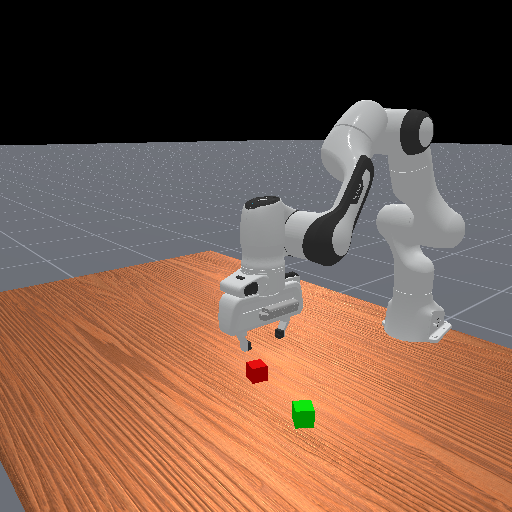

In [10]:
env = make_env("StackCube-v1", obs_mode="state", control_mode="pd_ee_delta_pose")
obs, info = env.reset(seed=0)

print(f"  Observation space : {env.observation_space.shape}")
img = render_frame(env)
display(img)

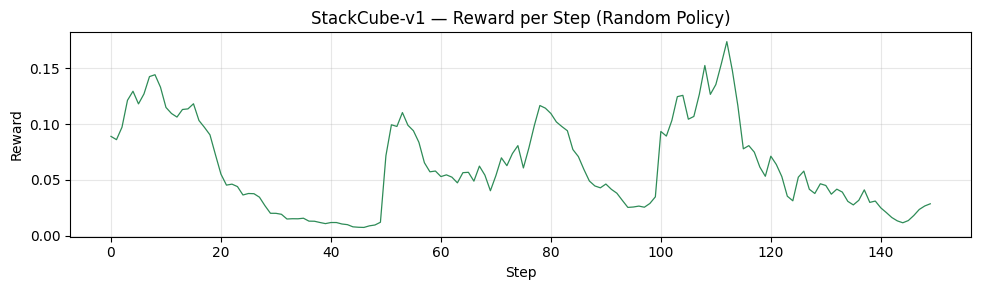

In [11]:
frames, rewards_stack, _ = run_and_collect(env, n_steps=150)
show_video(frames, fps=20)

fig, ax = plt.subplots(figsize=(10, 3))
ax.plot(rewards_stack, linewidth=0.9, color="seagreen")
ax.set_xlabel("Step")
ax.set_ylabel("Reward")
ax.set_title("StackCube-v1 — Reward per Step (Random Policy)")
ax.grid(True, alpha=0.3)
fig.tight_layout()
plt.show()
env.close()

---
## ส่วนที่ 7: ตัวอย่างที่ 4 — PegInsertionSide (เสียบหมุด)

**PegInsertionSide-v1**: แขนกลต้องหยิบ peg แล้วเสียบเข้าไปในรู
เป็นงาน contact-rich ที่ต้องการความแม่นยำสูง

### อธิบาย Environment

**ลักษณะเฉพาะของ PegInsertion:**
- เป็นงาน **contact-rich** — ระหว่างเสียบ peg จะมีแรงสัมผัส (contact force) ตลอด
- ต้องการ **alignment** ที่แม่นยำ — peg ต้องตรงกับรูก่อนเสียบ
- เป็น **ด้านข้าง (side insertion)** — เสียบในแนวนอน ไม่ใช่แนวตั้ง

**Observation Space** — ใหญ่กว่า task อื่นเพราะมีข้อมูล peg + box
```
[ joint_positions (7)
  joint_velocities (7)
  gripper_state (2)
  peg_position (3)         ← ตำแหน่ง peg
  peg_orientation (4)      ← ทิศทาง peg (สำคัญมากสำหรับ alignment)
  box_hole_position (3)    ← ตำแหน่งรูที่ต้องเสียบ
  box_hole_orientation (4) ← ทิศทางของรู
  ... ]
```

**ทำไม task นี้ยาก?**
- ต้อง **จับ peg ให้มั่น** ก่อน
- ต้อง **หมุน peg ให้ตรง** กับรู (orientation alignment)
- ระหว่างเสียบ **ถ้าเบี่ยงนิดเดียว** peg จะติด → ต้อง feedback control ที่ดี

  Observation space : (43,)
  Action space      : (7,)


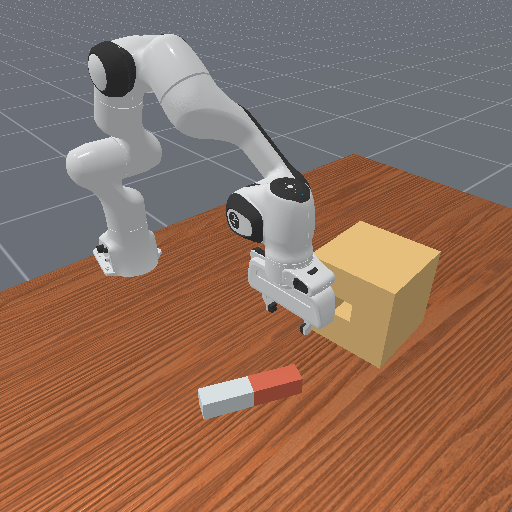

In [12]:
env = make_env("PegInsertionSide-v1", obs_mode="state", control_mode="pd_ee_delta_pose")
obs, info = env.reset(seed=0)

print(f"  Observation space : {env.observation_space.shape}")
print(f"  Action space      : {env.action_space.shape}")

img = render_frame(env)
display(img)

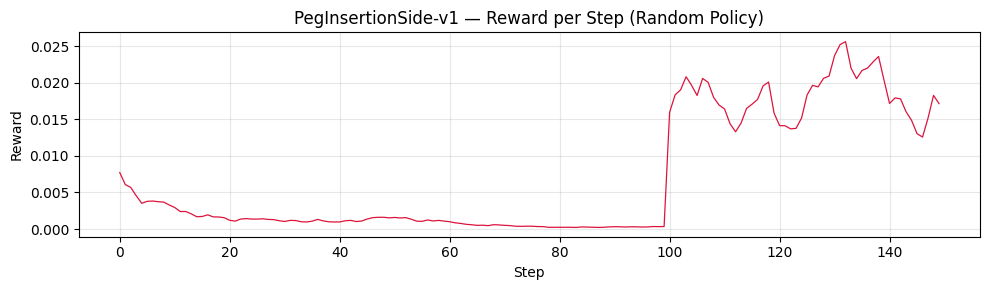

In [13]:
frames, rewards_peg, _ = run_and_collect(env, n_steps=150)
show_video(frames, fps=20)

fig, ax = plt.subplots(figsize=(10, 3))
ax.plot(rewards_peg, linewidth=0.9, color="crimson")
ax.set_xlabel("Step")
ax.set_ylabel("Reward")
ax.set_title("PegInsertionSide-v1 — Reward per Step (Random Policy)")
ax.grid(True, alpha=0.3)
fig.tight_layout()
plt.show()
env.close()

---
## ส่วนที่ 8: ตัวอย่างที่ 5 — Classic Control: CartPole

ManiSkill ยังมี classic control environments เช่น CartPole
ซึ่งเหมาะสำหรับทดสอบ RL algorithms เบื้องต้น

### อธิบาย Environment

**CartPole คืออะไร?**
- เป็น **classic control problem** ที่ใช้ทดสอบ RL algorithm มาตั้งแต่ยุคแรกๆ
- มีรถ (cart) วิ่งซ้าย-ขวาบนราง + ไม้ (pole) ติดอยู่ด้วยข้อต่อ
- เป้าหมาย: ออกแรงกับรถเพื่อไม่ให้ไม้ล้ม

**Observation Space** — `env.observation_space.shape → (5,)` (เล็กมาก!)
```
[ cart_position      ← ตำแหน่งรถบนราง
  cart_velocity      ← ความเร็วของรถ
  pole_angle         ← มุมเอียงของไม้ (0 = ตั้งตรง)
  pole_angular_vel   ← ความเร็วเชิงมุมของไม้
  time_step ]        ← เวลาปัจจุบัน
```

**Action Space** — `env.action_space.shape → (1,)` (มิติเดียว!)
```
action = [ force ]   ← แรงผลักรถ (ค่า + = ขวา, ค่า - = ซ้าย)
```

**เปรียบเทียบ 2 variants:**
- **Balance**: ไม้เริ่มตั้งตรง → แค่รักษาสมดุล (ง่าย)
- **SwingUp**: ไม้เริ่มห้อยลง → ต้องแกว่งขึ้นแล้วรักษาสมดุล (ยากกว่ามาก)

2026-02-28 02:39:24,030 - mani_skill  - WARNING - Currently ManiSkill does not support loading plane geometries from MJCFs
2026-02-28 02:39:24,031 - mani_skill  - WARNING - No initial pose set for articulation builder of cart_pole, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.


  Observation space : (10,)
  Action space      : (1,)


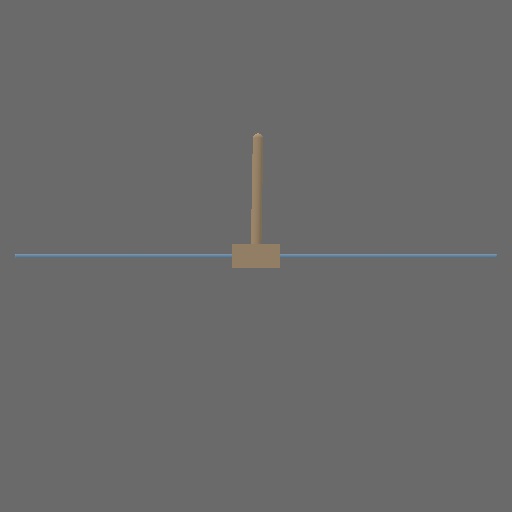

In [14]:
# 8.1 CartPole Balancing — รักษาสมดุลไม้
env = make_env("MS-CartpoleBalance-v1", obs_mode="state")
obs, info = env.reset(seed=0)

print(f"  Observation space : {env.observation_space.shape}")
print(f"  Action space      : {env.action_space.shape}")

img = render_frame(env)
display(img)

In [15]:
frames_bal, rewards_bal, _ = run_and_collect(env, n_steps=200)
show_video(frames_bal, fps=30)
env.close()

2026-02-28 02:39:24,608 - mani_skill  - WARNING - No initial pose set for articulation builder of cart_pole, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.


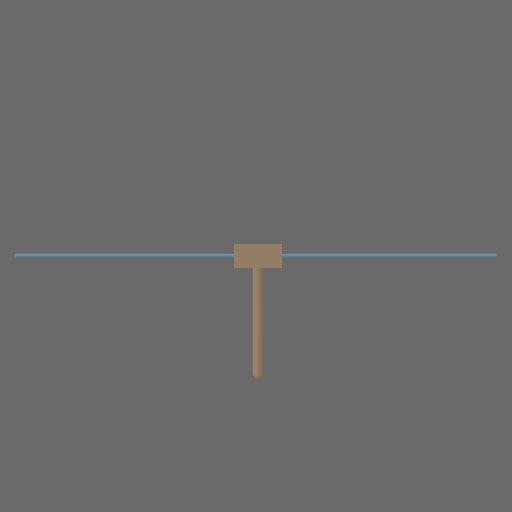

In [16]:
# 8.2 CartPole SwingUp — แกว่งไม้ขึ้นแล้วรักษาสมดุล (ยากกว่า)
env = make_env("MS-CartpoleSwingUp-v1", obs_mode="state")
obs, info = env.reset(seed=0)

img = render_frame(env)
display(img)

frames_swu, rewards_swu, _ = run_and_collect(env, n_steps=200)
show_video(frames_swu, fps=30)
env.close()

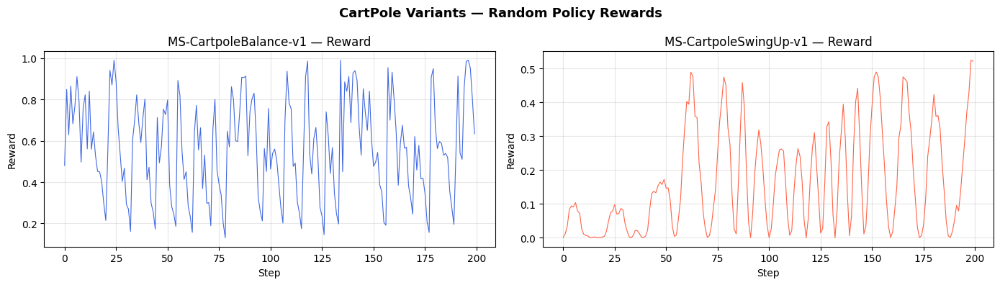

  Balancing  — Mean Reward: 0.5688
  SwingUp    — Mean Reward: 0.1653


In [17]:
# 8.3 เปรียบเทียบ reward ระหว่าง Balancing vs SwingUp
fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharey=False)

axes[0].plot(rewards_bal, linewidth=0.8, color="royalblue")
axes[0].set_title("MS-CartpoleBalance-v1 — Reward")
axes[0].set_xlabel("Step")
axes[0].set_ylabel("Reward")
axes[0].grid(True, alpha=0.3)

axes[1].plot(rewards_swu, linewidth=0.8, color="tomato")
axes[1].set_title("MS-CartpoleSwingUp-v1 — Reward")
axes[1].set_xlabel("Step")
axes[1].set_ylabel("Reward")
axes[1].grid(True, alpha=0.3)

fig.suptitle("CartPole Variants — Random Policy Rewards", fontsize=13, fontweight="bold")
fig.tight_layout()
plt.show()

print(f"  Balancing  — Mean Reward: {np.mean(rewards_bal):.4f}")
print(f"  SwingUp    — Mean Reward: {np.mean(rewards_swu):.4f}")

---
## ส่วนที่ 9: ตัวอย่างที่ 6 — Mobile Manipulation: OpenCabinetDrawer

**OpenCabinetDrawer-v1**: หุ่นยนต์แบบ mobile base ต้องเคลื่อนที่ไปเปิดลิ้นชักตู้
⚠️ ต้อง download assets ก่อนรัน

### อธิบาย Environment

**ลักษณะเฉพาะ:**
- ใช้หุ่นยนต์ **mobile manipulator** (มี base เคลื่อนที่ได้ + แขนกล)
- ต้อง **เข้าใกล้ตู้** → **จับมือจับลิ้นชัก** → **ดึงออก**
- ตู้มีหลายแบบ (heterogeneous) → ต้อง generalize

**Observation Space** — ใหญ่กว่า table-top tasks เพราะมี mobile base
```
[ base_position (3)       ← ตำแหน่ง base ของหุ่นยนต์ (x, y, yaw)
  base_velocity (3)       ← ความเร็ว base
  arm_joint_pos (7)       ← มุมข้อต่อแขน
  arm_joint_vel (7)       ← ความเร็วข้อต่อแขน
  gripper_state (2)
  drawer_position (3)     ← ตำแหน่งลิ้นชัก
  drawer_joint_state (1)  ← ลิ้นชักเปิดแค่ไหน (0=ปิด, 1=เปิดสุด)
  handle_position (3)     ← ตำแหน่งมือจับ
  ... ]
```

**Action Space** — รวม base movement + arm control
```
action = [ base_dx, base_dy, base_dyaw,  ← เคลื่อนที่ฐาน
           arm_joints...,                  ← ควบคุมแขน
           gripper ]                       ← จับ/ปล่อย
```

In [18]:
# Download assets สำหรับ environment ที่ต้องการ
download_asset("OpenCabinetDrawer-v1")
print("✅ Download assets เสร็จสิ้น")

✅ Download assets เสร็จสิ้น


  Observation space : (44,)
  Action space      : (13,)


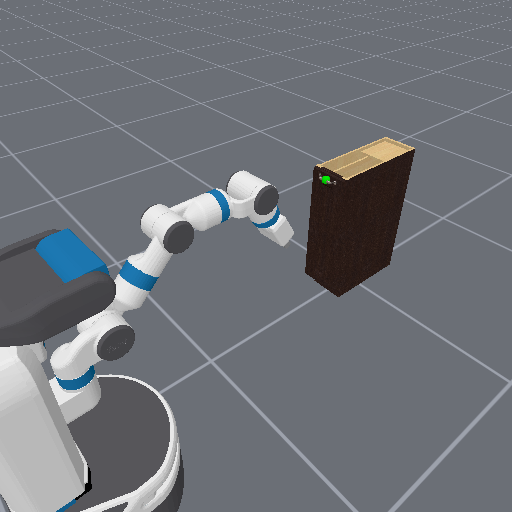

In [19]:
try:
    env = make_env("OpenCabinetDrawer-v1", obs_mode="state")
    obs, info = env.reset(seed=0)

    print(f"  Observation space : {env.observation_space.shape}")
    print(f"  Action space      : {env.action_space.shape}")

    img = render_frame(env)
    display(img)

    frames = run_random_policy(env, n_steps=150)
    show_video(frames, fps=20)
    env.close()
except Exception as e:
    print(f"⚠️ OpenCabinetDrawer: {e}")

---
## ส่วนที่ 10: ตัวอย่างที่ 7 — PickSingleYCB (หยิบวัตถุ YCB)

**PickSingleYCB-v1**: หยิบวัตถุจาก YCB dataset (วัตถุจริงที่ถูก scan 3D)
Environment นี้รองรับ **heterogeneous simulation** — วัตถุต่างกันในแต่ละ episode

### อธิบาย Environment

**YCB Dataset คืออะไร?**
- **Yale-CMU-Berkeley Object Set** — ชุดวัตถุมาตรฐานสำหรับ robotics research
- วัตถุจริงถูก 3D scan → ได้โมเดลที่สมจริงทั้ง shape, texture, mass
- ตัวอย่างวัตถุ: ขวดน้ำ, กล่อง, ถ้วย, กล้วย, ค้อน, ลูกเบสบอล

**Heterogeneous Simulation:**
- ทุกครั้งที่ reset → สุ่มวัตถุ YCB ใหม่ (seed ต่างกัน = วัตถุต่างกัน)
- หุ่นยนต์ต้อง **generalize** — จับวัตถุรูปทรงต่างกันได้
- นี่คือจุดเด่นของ ManiSkill3 ที่ไม่เหมือน simulator อื่น

**ความท้าทาย:**
- วัตถุแต่ละอันมี shape ต่างกัน → ต้อง grasp strategy ต่างกัน
- บางอันเล็ก (ลูกกอล์ฟ) บางอันใหญ่ (กล่อง) → ต้อง adaptive grasp
- จุด grasp ที่ดีสำหรับแต่ละวัตถุไม่เหมือนกัน

In [20]:
download_asset("PickSingleYCB-v1")
print("✅ Download YCB assets เสร็จสิ้น")

✅ Download YCB assets เสร็จสิ้น


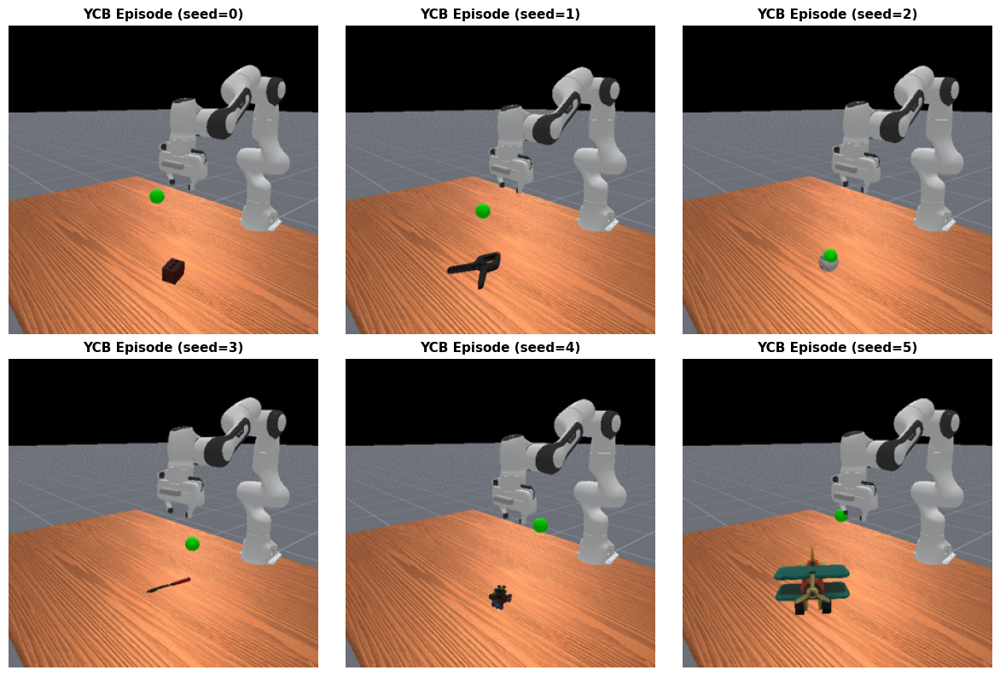

In [21]:
try:
    env = make_env("PickSingleYCB-v1", obs_mode="state", control_mode="pd_ee_delta_pose")

    # Render หลาย episode เพื่อดูวัตถุที่แตกต่างกัน
    images = []
    titles = []
    for seed in range(6):
        obs, info = env.reset(seed=seed)
        img = render_frame(env, width=300, height=300)
        images.append(np.array(img))
        titles.append(f"YCB Episode (seed={seed})")

    show_grid(images, titles=titles, cols=3, figsize=(12, 8))

    # รันวิดีโอสำหรับ 1 episode
    env.reset(seed=0)
    frames = run_random_policy(env, n_steps=100)
    show_video(frames, fps=20)
    env.close()
except Exception as e:
    print(f"⚠️ PickSingleYCB: {e}")

---
## ส่วนที่ 11: Observation Modes — มุมมองต่างๆ ของหุ่นยนต์

ManiSkill รองรับหลาย observation modes:
- `"state"` — state vector (ตำแหน่งข้อต่อ, ตำแหน่งวัตถุ ฯลฯ)
- `"rgbd"` — RGB + Depth images จากกล้อง
- `"pointcloud"` — Point cloud 3D
- `"state_dict"` — state แบบ dictionary (แยกตาม component)

### อธิบาย Observation Modes ทีละตัว

**1. `"state"` — State Vector (ง่ายที่สุด, เร็วที่สุด)**
```
obs.shape → (25,)  ← ตัวเลข 1 มิติ
```
- ได้ข้อมูลทุกอย่างเป็นตัวเลข (ตำแหน่งข้อต่อ, ตำแหน่งวัตถุ ฯลฯ)
- **ข้อดี**: ข้อมูลครบ, ประมวลผลเร็ว, เหมาะเริ่มต้น
- **ข้อเสีย**: ในโลกจริงไม่มี ground-truth state → ไม่ transfer ไปหุ่นจริงได้

**2. `"state_dict"` — State Dictionary**
```
obs = { "agent": {...}, "extra": {...} }  ← dict ที่แยกตาม component
```
- ข้อมูลเหมือน `state` แต่จัดกลุ่มเป็น dictionary
- แยก agent state (หุ่นยนต์) กับ extra info (วัตถุ, goal) ชัดเจน

**3. `"rgbd"` — RGB + Depth Images (สมจริงที่สุด)**
```
obs = { "sensor_data": { "base_camera": { "rgb": (H,W,3), "depth": (H,W,1) },
                          "hand_camera": { "rgb": (H,W,3), "depth": (H,W,1) } },
         "agent": {...} }
```
- ได้ภาพ RGB และ Depth จากกล้องของหุ่นยนต์
- **ข้อดี**: สมจริง, transfer ไปหุ่นจริงได้ (sim-to-real)
- **ข้อเสีย**: ข้อมูลใหญ่มาก (~150K+ dimensions), ต้องใช้ CNN/ViT ประมวลผล

**4. `"pointcloud"` — Point Cloud 3D**
- ได้จุด 3D ในอวกาศ (x, y, z) + สี (r, g, b) ของฉากทั้งหมด
- เหมาะกับ point-cloud-based models (PointNet, PointNet++)

In [22]:
# 11.1 เปรียบเทียบ observation ในแต่ละ mode
print("=" * 65)
print("  Observation Modes Comparison on PickCube-v1")
print("=" * 65)

obs_mode_info = {}

for obs_mode in ["state", "state_dict", "rgbd"]:
    env = make_env("PickCube-v1", obs_mode=obs_mode)
    obs, info = env.reset(seed=0)

    print(f"\n🔹 obs_mode = '{obs_mode}'")
    if isinstance(obs, dict):
        detail = {}
        for key, val in obs.items():
            if isinstance(val, dict):
                for k2, v2 in val.items():
                    shape = v2.shape if hasattr(v2, "shape") else type(v2).__name__
                    label = f"{key}/{k2}"
                    detail[label] = shape
                    print(f"   obs['{key}']['{k2}'] -> {shape}")
            elif hasattr(val, "shape"):
                detail[key] = val.shape
                print(f"   obs['{key}'] -> shape {val.shape}")
            else:
                detail[key] = type(val).__name__
                print(f"   obs['{key}'] -> {type(val).__name__}")
        obs_mode_info[obs_mode] = detail
    else:
        print(f"   obs shape: {obs.shape}")
        obs_mode_info[obs_mode] = {"flat": obs.shape}
    env.close()

  Observation Modes Comparison on PickCube-v1

🔹 obs_mode = 'state'
   obs shape: (42,)

🔹 obs_mode = 'state_dict'
   obs['agent']['qpos'] -> (9,)
   obs['agent']['qvel'] -> (9,)
   obs['extra']['is_grasped'] -> bool
   obs['extra']['tcp_pose'] -> (7,)
   obs['extra']['goal_pos'] -> (3,)
   obs['extra']['obj_pose'] -> (7,)
   obs['extra']['tcp_to_obj_pos'] -> (3,)
   obs['extra']['obj_to_goal_pos'] -> (3,)

🔹 obs_mode = 'rgbd'
   obs['agent']['qpos'] -> (9,)
   obs['agent']['qvel'] -> (9,)
   obs['extra']['is_grasped'] -> bool
   obs['extra']['tcp_pose'] -> (7,)
   obs['extra']['goal_pos'] -> (3,)
   obs['sensor_param']['base_camera'] -> dict
   obs['sensor_data']['base_camera'] -> dict


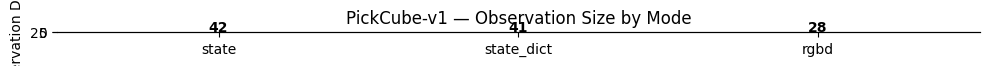

In [23]:
# 11.2 Visualize — bar chart ของ observation dimensions
fig, ax = plt.subplots(figsize=(10, 4))

mode_dims = {}
for obs_mode in ["state", "state_dict", "rgbd"]:
    env = make_env("PickCube-v1", obs_mode=obs_mode)
    obs, info = env.reset(seed=0)

    if isinstance(obs, dict):
        total = 0
        for key, val in obs.items():
            if isinstance(val, dict):
                for k2, v2 in val.items():
                    if hasattr(v2, "shape"):
                        total += int(np.prod(v2.shape))
            elif hasattr(val, "shape"):
                total += int(np.prod(val.shape))
        mode_dims[obs_mode] = total
    else:
        mode_dims[obs_mode] = int(np.prod(obs.shape))
    env.close()

bars = ax.bar(mode_dims.keys(), mode_dims.values(),
              color=["steelblue", "darkorange", "seagreen"], edgecolor="black")
ax.set_ylabel("Total Observation Dimensions")
ax.set_title("PickCube-v1 — Observation Size by Mode")
ax.grid(axis="y", alpha=0.3)
for bar, val in zip(bars, mode_dims.values()):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 50,
            f"{val:,}", ha="center", fontsize=10, fontweight="bold")
fig.tight_layout()
plt.show()

🔑 Keys ใน observation:
   agent/qpos: (9,)
   agent/qvel: (9,)
   extra/is_grasped: bool
   extra/tcp_pose: (7,)
   extra/goal_pos: (3,)
   sensor_param/base_camera: dict
   sensor_data/base_camera: dict


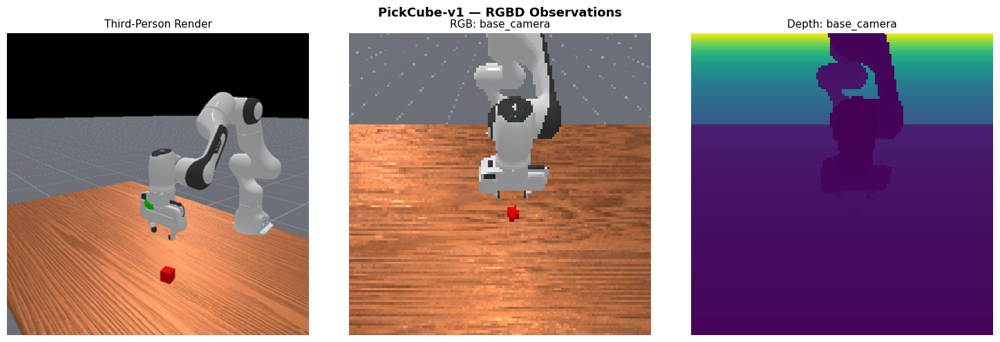

In [24]:
# 11.3 แสดง RGBD observations — ภาพ RGB และ Depth จากกล้องหุ่นยนต์
env = make_env("PickCube-v1", obs_mode="rgbd")
obs, info = env.reset(seed=0)

print("🔑 Keys ใน observation:")
if isinstance(obs, dict):
    for k, v in obs.items():
        if isinstance(v, dict):
            for k2, v2 in v.items():
                shape = v2.shape if hasattr(v2, "shape") else type(v2).__name__
                print(f"   {k}/{k2}: {shape}")
        elif hasattr(v, "shape"):
            print(f"   {k}: {v.shape}")

# พยายามดึง RGB + Depth ออกมาแสดง
vis_images = []
vis_titles = []

# third-person render
third_img = render_frame(env, width=350, height=350)
vis_images.append(np.array(third_img))
vis_titles.append("Third-Person Render")

# ดึง sensor data (ถ้ามี)
if isinstance(obs, dict) and "sensor_data" in obs:
    for cam_name, cam_data in obs["sensor_data"].items():
        if isinstance(cam_data, dict):
            if "rgb" in cam_data:
                rgb = cam_data["rgb"]
                if isinstance(rgb, torch.Tensor):
                    rgb = rgb.cpu().numpy()
                if rgb.ndim == 4:
                    rgb = rgb[0]
                if rgb.dtype != np.uint8:
                    rgb = (rgb * 255).clip(0, 255).astype(np.uint8)
                vis_images.append(rgb)
                vis_titles.append(f"RGB: {cam_name}")
            if "depth" in cam_data:
                depth = cam_data["depth"]
                if isinstance(depth, torch.Tensor):
                    depth = depth.cpu().numpy()
                if depth.ndim == 4:
                    depth = depth[0]
                if depth.ndim == 3:
                    depth = depth[..., 0]
                vis_images.append(depth)
                vis_titles.append(f"Depth: {cam_name}")

if len(vis_images) > 1:
    n = len(vis_images)
    fig, axes = plt.subplots(1, n, figsize=(5 * n, 5))
    if n == 1:
        axes = [axes]
    for ax, im, t in zip(axes, vis_images, vis_titles):
        if "Depth" in t:
            ax.imshow(im, cmap="viridis")
        else:
            ax.imshow(im)
        ax.set_title(t, fontsize=11)
        ax.axis("off")
    fig.suptitle("PickCube-v1 — RGBD Observations", fontsize=13, fontweight="bold")
    fig.tight_layout()
    plt.show()
else:
    display(third_img)

env.close()

---
## ส่วนที่ 12: Control Modes — วิธีควบคุมหุ่นยนต์

ManiSkill รองรับหลาย control modes:

| Control Mode | คำอธิบาย |
|---|---|
| `pd_joint_delta_pos` | ควบคุมข้อต่อแบบ delta position (ง่ายสุด) |
| `pd_ee_delta_pose` | ควบคุม end-effector แบบ delta pose (x,y,z,quat) |
| `pd_ee_delta_pos` | ควบคุม end-effector แบบ delta position เท่านั้น |
| `pd_joint_pos` | ควบคุมข้อต่อด้วย target position โดยตรง |

### อธิบาย Control Modes ทีละตัว

**1. `pd_joint_delta_pos` — Joint Space Delta (ง่ายสุด)**
```
action = [ dq1, dq2, ..., dq7, gripper ]  ← 8 มิติ
```
- สั่ง **เปลี่ยนมุมข้อต่อ** โดยตรง (delta = เปลี่ยนแปลง)
- ข้อดี: ง่าย, ตรงไปตรงมา
- ข้อเสีย: ควบคุมตำแหน่ง end-effector ยาก — ต้องคิด inverse kinematics เอง

**2. `pd_ee_delta_pose` — End-Effector Delta Pose (นิยมที่สุด)**
```
action = [ dx, dy, dz, droll, dpitch, dyaw, gripper ]  ← 7 มิติ
```
- สั่ง **เลื่อนมือ** ไปทิศ x, y, z + **หมุนมือ**
- ข้อดี: intuitive — คิดแค่ "มือไปทางไหน"
- ข้อเสีย: อาจไม่เสถียรใกล้ singularities

**3. `pd_ee_delta_pos` — End-Effector Delta Position Only**
```
action = [ dx, dy, dz, gripper ]  ← 4 มิติ
```
- เหมือน `pd_ee_delta_pose` แต่ **ไม่หมุนมือ** → action space เล็กกว่า

**4. `pd_joint_pos` — Joint Position (Absolute)**
```
action = [ q1, q2, ..., q7, gripper ]  ← 8 มิติ
```
- สั่ง **ตำแหน่งเป้าหมายของข้อต่อ** โดยตรง (ไม่ใช่ delta)
- ข้อดี: แม่นยำ, ไม่มีปัญหา drift

In [25]:
# 12.1 เปรียบเทียบ action space ของแต่ละ control mode
print("=" * 65)
print("  Control Modes Comparison on PickCube-v1")
print("=" * 65)

control_modes = [
    "pd_joint_delta_pos",
    "pd_ee_delta_pose",
    "pd_ee_delta_pos",
    "pd_joint_pos",
]

cm_dims = {}
for cm in control_modes:
    try:
        env = make_env("PickCube-v1", obs_mode="state", control_mode=cm)
        obs, info = env.reset(seed=0)
        dim = env.action_space.shape[0]
        cm_dims[cm] = dim
        print(f"\n🔹 control_mode = '{cm}'")
        print(f"   Action space shape : {env.action_space.shape}")
        print(f"   Action low  (3)    : {env.action_space.low[:3].round(3)}")
        print(f"   Action high (3)    : {env.action_space.high[:3].round(3)}")
        env.close()
    except Exception as e:
        print(f"\n🔹 control_mode = '{cm}' -> {e}")

  Control Modes Comparison on PickCube-v1

🔹 control_mode = 'pd_joint_delta_pos'
   Action space shape : (8,)
   Action low  (3)    : [-1. -1. -1.]
   Action high (3)    : [1. 1. 1.]

🔹 control_mode = 'pd_ee_delta_pose'
   Action space shape : (7,)
   Action low  (3)    : [-1. -1. -1.]
   Action high (3)    : [1. 1. 1.]

🔹 control_mode = 'pd_ee_delta_pos'
   Action space shape : (4,)
   Action low  (3)    : [-1. -1. -1.]
   Action high (3)    : [1. 1. 1.]

🔹 control_mode = 'pd_joint_pos'
   Action space shape : (8,)
   Action low  (3)    : [-2.897 -1.763 -2.897]
   Action high (3)    : [2.897 1.763 2.897]


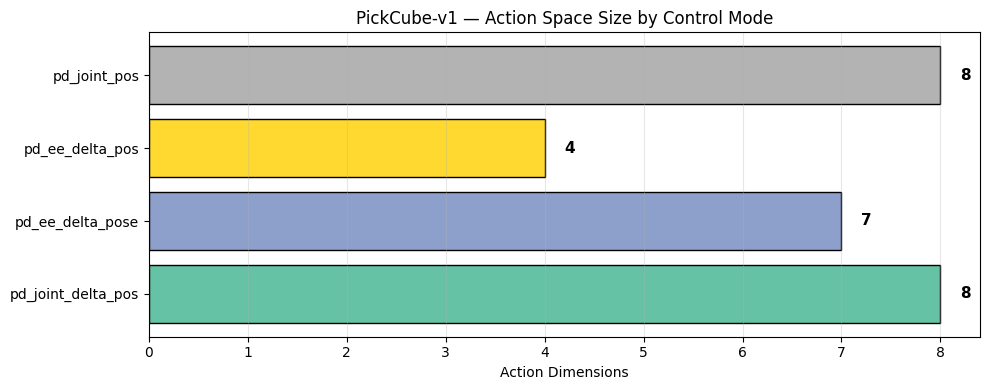

In [26]:
# 12.2 Visualize action space dimensions
if cm_dims:
    fig, ax = plt.subplots(figsize=(10, 4))
    colors = plt.cm.Set2(np.linspace(0, 1, len(cm_dims)))
    bars = ax.barh(list(cm_dims.keys()), list(cm_dims.values()),
                   color=colors, edgecolor="black")
    ax.set_xlabel("Action Dimensions")
    ax.set_title("PickCube-v1 — Action Space Size by Control Mode")
    ax.grid(axis="x", alpha=0.3)
    for bar, val in zip(bars, cm_dims.values()):
        ax.text(bar.get_width() + 0.2, bar.get_y() + bar.get_height() / 2,
                str(val), va="center", fontsize=11, fontweight="bold")
    fig.tight_layout()
    plt.show()


📊 Running 200-step random policy per control mode...


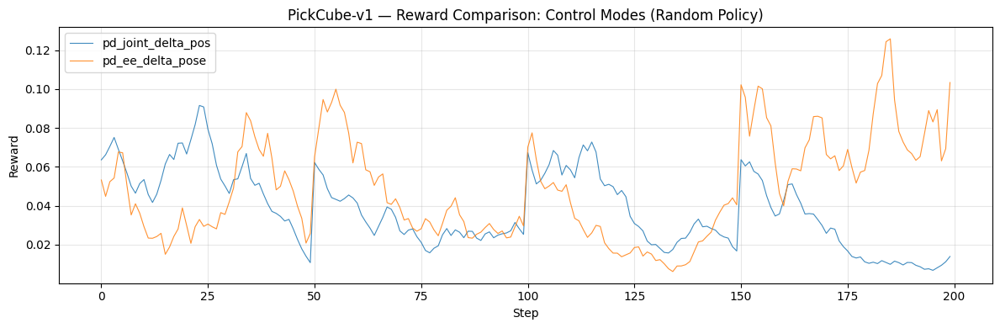

  pd_joint_delta_pos         mean=0.0380  total=7.5955
  pd_ee_delta_pose           mean=0.0486  total=9.7279


In [27]:
# 12.3 เปรียบเทียบ reward ระหว่าง control modes ด้วย random policy
print("\n📊 Running 200-step random policy per control mode...")
cm_rewards = {}
for cm in ["pd_joint_delta_pos", "pd_ee_delta_pose"]:
    try:
        env = make_env("PickCube-v1", obs_mode="state", control_mode=cm)
        _, rews, _ = run_and_collect(env, n_steps=200)
        cm_rewards[cm] = rews
        env.close()
    except Exception as e:
        print(f"  {cm}: {e}")

if len(cm_rewards) >= 2:
    fig, ax = plt.subplots(figsize=(12, 4))
    for cm, rews in cm_rewards.items():
        ax.plot(rews, label=cm, linewidth=0.8, alpha=0.85)
    ax.set_xlabel("Step")
    ax.set_ylabel("Reward")
    ax.set_title("PickCube-v1 — Reward Comparison: Control Modes (Random Policy)")
    ax.legend()
    ax.grid(True, alpha=0.3)
    fig.tight_layout()
    plt.show()

    for cm, rews in cm_rewards.items():
        print(f"  {cm:25s}  mean={np.mean(rews):.4f}  total={np.sum(rews):.4f}")

---
## ส่วนที่ 13: GPU Parallelized Simulation — รัน Environments พร้อมกัน

จุดเด่นสำคัญของ ManiSkill3 คือการรันหลาย environment พร้อมกันบน GPU
ซึ่งเร่งความเร็วในการเก็บข้อมูลสำหรับ RL/IL ได้มหาศาล

### อธิบาย GPU Parallelization

**ทำไมต้อง parallel?**
- RL ต้องการข้อมูล (transitions) จำนวนมาก → ยิ่งเก็บเร็วยิ่งดี
- CPU: รัน 1 env → ~1,000 FPS
- GPU: รัน 1,000 envs พร้อมกัน → **30,000+ FPS** (เร็วกว่า 30 เท่า!)

**วิธีใช้:**
```python
env = gym.make("PushCube-v1", num_envs=1024)  # สร้าง 1024 envs พร้อมกัน
obs = env.reset()      # obs.shape → (1024, 25)  ← batch dimension
action = env.action_space.sample()  # action.shape → (1024, 7)
obs, reward, term, trunc, info = env.step(action)
# reward.shape → (1024,)  ← reward จากทุก env พร้อมกัน!
```

**ข้อจำกัด:**
- GPU PhysX ถูก initialize ได้ **ครั้งเดียวต่อ process**
- ถ้าเริ่มด้วย CPU mode (num_envs=1) → สลับไป GPU ไม่ได้ใน process เดียวกัน
- ในการใช้งานจริง ควรรัน GPU code ใน **process แยก**

**ข้อมูลทั้งหมดอยู่บน GPU (torch.Tensor):**
```
obs.device    → cuda:0    ← ไม่ต้อง transfer ไป GPU เอง
reward.device → cuda:0    ← พร้อมใช้กับ neural network ทันที
```

In [28]:
# 13.1 สร้าง batched environment (ไม่ต้องใช้ CPUGymWrapper)
# ⚠️ GPU PhysX สามารถ enable ได้ครั้งเดียวต่อ process
# หากก่อนหน้านี้ใช้ CPU mode (num_envs=1) แล้ว จะไม่สามารถสลับเป็น GPU mode ได้
NUM_ENVS = 4

try:
    env_batched = gym.make(
        "PushCube-v1",
        num_envs=NUM_ENVS,
        obs_mode="state",
        control_mode="pd_ee_delta_pose",
        render_mode="rgb_array",
    )

    obs, info = env_batched.reset(seed=0)

    print(f"  Num envs          : {NUM_ENVS}")
    print(f"  Observation shape  : {obs.shape}")
    print(f"  Action space shape : {env_batched.action_space.shape}")
    print(f"  Device             : {obs.device if hasattr(obs, 'device') else 'cpu'}")

    # 13.2 Step ทุก environment พร้อมกัน
    action = env_batched.action_space.sample()
    obs, reward, terminated, truncated, info = env_batched.step(action)

    print(f"  Obs shape        : {obs.shape}")
    print(f"  Reward shape     : {reward.shape}")
    print(f"  Terminated shape : {terminated.shape}")
    print(f"  Reward values    : {reward}")

    env_batched.close()
except RuntimeError as e:
    print(f"⚠️ GPU Batched Env: {e}")
    print("   (GPU PhysX ไม่สามารถ enable ได้หลังจากใช้ CPU mode ในกระบวนการเดียวกัน)")
    print("   ในการใช้งานจริง ให้รัน GPU parallelized code ใน process แยก")

⚠️ GPU Batched Env: GPU PhysX can only be enabled once before any other code involving PhysX
   (GPU PhysX ไม่สามารถ enable ได้หลังจากใช้ CPU mode ในกระบวนการเดียวกัน)
   ในการใช้งานจริง ให้รัน GPU parallelized code ใน process แยก


In [29]:
# 13.3 Render all parallel envs side by side
NUM_ENVS_VIS = 6

try:
    env_par = gym.make(
        "PushCube-v1",
        num_envs=NUM_ENVS_VIS,
        obs_mode="state",
        control_mode="pd_ee_delta_pose",
        render_mode="rgb_array",
    )
    env_par.reset(seed=42)

    # Step a few times
    for _ in range(20):
        env_par.step(env_par.action_space.sample())

    frame = env_par.render()
    if isinstance(frame, torch.Tensor):
        frame = frame.cpu().numpy()
    if frame.ndim == 4:
        imgs = []
        ttls = []
        for i in range(min(frame.shape[0], NUM_ENVS_VIS)):
            f = frame[i]
            if f.dtype != np.uint8:
                f = (f * 255).clip(0, 255).astype(np.uint8)
            imgs.append(f)
            ttls.append(f"Parallel Env {i}")
        show_grid(imgs, titles=ttls, cols=3, figsize=(14, 9))
    else:
        frame = to_uint8(frame)
        fig, ax = plt.subplots(figsize=(14, 6))
        ax.imshow(frame)
        ax.set_title(f"PushCube-v1 — {NUM_ENVS_VIS} Parallel Envs Rendered", fontsize=13)
        ax.axis("off")
        plt.show()

    env_par.close()
except RuntimeError as e:
    print(f"⚠️ GPU Parallel Render: {e}")
    print("   (ข้ามส่วน parallel rendering เนื่องจาก GPU PhysX limitation)")

⚠️ GPU Parallel Render: GPU PhysX can only be enabled once before any other code involving PhysX
   (ข้ามส่วน parallel rendering เนื่องจาก GPU PhysX limitation)


---
## ส่วนที่ 14: เปรียบเทียบ Rendering — หลาย Environments พร้อมกัน

แสดงภาพจากหลาย environment types เพื่อเห็นความหลากหลาย

### อธิบาย

เรารวม render จากหลาย environment ลงใน grid เดียว เพื่อ:
- เห็นความ **หลากหลาย** ของ task types ใน ManiSkill3
- เปรียบเทียบ **visual complexity** ของแต่ละ task
- Table-top tasks (PushCube, PickCube, StackCube) ดูคล้ายกัน แต่ task ต่างกัน
- CartPole ดูง่ายกว่ามาก (ไม่มีหุ่นยนต์ ไม่มีวัตถุ)

2026-02-28 02:39:36,923 - mani_skill  - WARNING - No initial pose set for articulation builder of cart_pole, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.
2026-02-28 02:39:37,130 - mani_skill  - WARNING - No initial pose set for articulation builder of cart_pole, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.


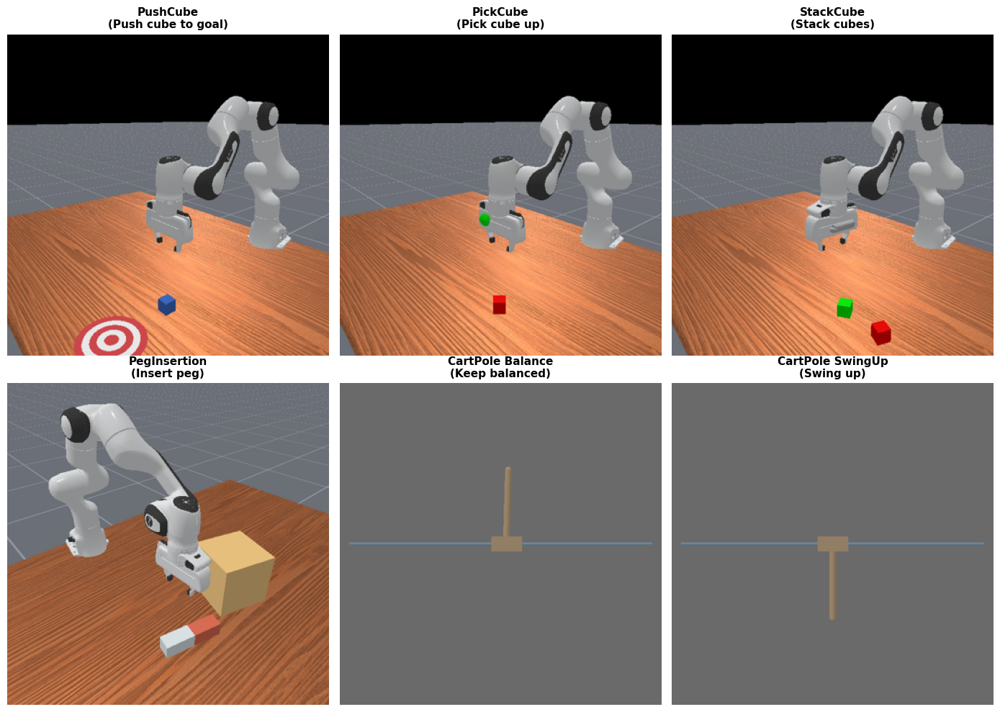

In [30]:
envs_to_show = [
    ("PushCube-v1",          "PushCube\n(Push cube to goal)"),
    ("PickCube-v1",          "PickCube\n(Pick cube up)"),
    ("StackCube-v1",         "StackCube\n(Stack cubes)"),
    ("PegInsertionSide-v1",  "PegInsertion\n(Insert peg)"),
    ("MS-CartpoleBalance-v1", "CartPole Balance\n(Keep balanced)"),
    ("MS-CartpoleSwingUp-v1",   "CartPole SwingUp\n(Swing up)"),
]

images = []
titles = []

for env_id, title in envs_to_show:
    try:
        env = make_env(env_id, obs_mode="state")
        env.reset(seed=42)
        img = render_frame(env, width=350, height=350)
        images.append(np.array(img))
        titles.append(title)
        env.close()
    except Exception as e:
        print(f"⚠️ {env_id}: {e}")

show_grid(images, titles=titles, cols=3, figsize=(14, 10))

---
## ส่วนที่ 15: การบันทึกวิดีโอด้วย RecordEpisode Wrapper

ManiSkill มี wrapper สำหรับบันทึกวิดีโอของ episode โดยอัตโนมัติ

### อธิบาย RecordEpisode Wrapper

**Wrapper pattern:**
```python
env = gym.make("PickCube-v1", ...)
env = RecordEpisode(env, output_dir="videos", save_video=True)
```
- ครอบ environment ด้วย wrapper → ทุก step ถูกบันทึกอัตโนมัติ
- เมื่อ episode จบ (terminated/truncated) → บันทึกเป็น .mp4
- `info_on_video=True` → แสดง reward, step count บนวิดีโอ

**ประโยชน์:**
- debug policy ได้ง่าย — ดูว่าหุ่นยนต์ทำอะไร
- ใช้สำหรับ **evaluation** — บันทึกผลลัพธ์ trained policy
- เหมาะสำหรับ **presentation** — แสดงผลให้ผู้อื่นดู

In [31]:
from mani_skill.utils.wrappers import RecordEpisode

# สร้าง directory สำหรับเก็บวิดีโอ
os.makedirs("videos", exist_ok=True)

# สร้าง environment พร้อม RecordEpisode wrapper
env = make_env("PickCube-v1", obs_mode="state", control_mode="pd_ee_delta_pose")
env = RecordEpisode(env, output_dir="videos", save_video=True, info_on_video=True)

obs, info = env.reset(seed=0)
for step in range(200):
    action = env.action_space.sample()
    obs, reward, terminated, truncated, info = env.step(action)
    if terminated or truncated:
        break

env.close()
print("✅ วิดีโอถูกบันทึกไว้ที่ ./videos/")
video_files = [f for f in os.listdir("videos") if f.endswith((".mp4", ".webm"))]
print(f"   ไฟล์ที่บันทึก ({len(video_files)} files): {video_files[:5]}")

2026-02-28 02:39:37,570 - mani_skill  - WARNING - mani_skill is not installed with git.


✅ วิดีโอถูกบันทึกไว้ที่ ./videos/
   ไฟล์ที่บันทึก (1 files): ['0.mp4']


---
## ส่วนที่ 16: ตัวอย่างที่ 8 — เปลี่ยน Robot: ใช้ Fetch แทน Panda

บาง environment รองรับการเปลี่ยนหุ่นยนต์ด้วย `robot_uids`

### อธิบาย Robot Types

**Franka Panda (default):**
- แขนกล 7-DOF + gripper 2 นิ้ว
- ยึดติดกับโต๊ะ (fixed base)
- เป็น **research robot** ที่นิยมมากที่สุดในวงการ manipulation
- Action: 7 มิติ (ee delta pose) หรือ 8 มิติ (joint pos + gripper)

**Fetch:**
- หุ่นยนต์ **mobile manipulator** — มีฐานล้อ + แขนกล + gripper
- มี **mobile base** → เคลื่อนที่ในห้องได้
- Action space ใหญ่กว่า Panda (เพิ่ม base control)
- Observation space ก็ใหญ่กว่า (เพิ่ม base state)

**วิธีเปลี่ยน Robot:**
```python
env = gym.make("PickCube-v1", robot_uids="fetch")  # ← แค่เพิ่ม parameter
```
- Task เดิม แต่หุ่นยนต์ต่างกัน → ความยากเปลี่ยน

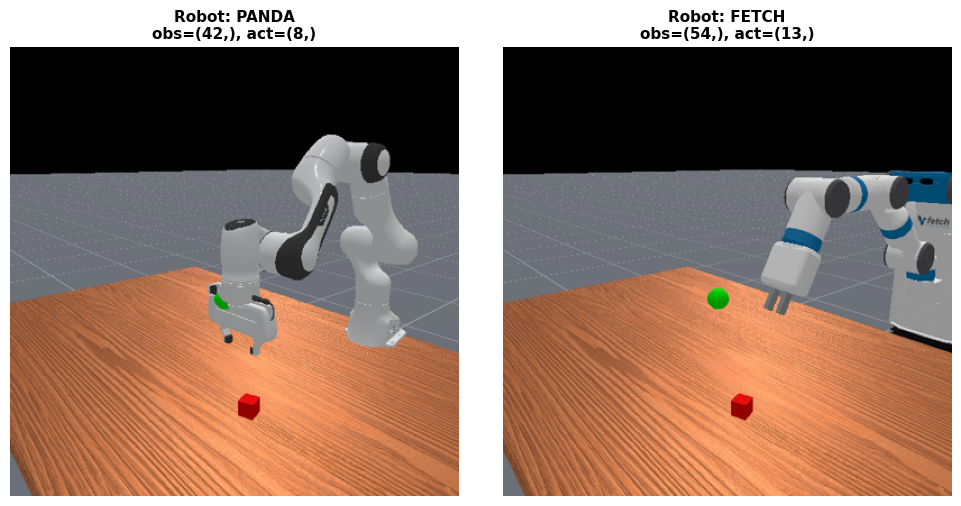

In [32]:
# เปรียบเทียบ Panda vs Fetch
robots_to_compare = ["panda", "fetch"]
robot_images = []
robot_titles = []
robot_info = {}

for robot in robots_to_compare:
    try:
        env = make_env("PickCube-v1", obs_mode="state", robot_uids=robot)
        obs, info = env.reset(seed=0)
        img = render_frame(env, width=400, height=400)
        robot_images.append(np.array(img))
        robot_titles.append(f"Robot: {robot.upper()}\nobs={obs.shape}, act={env.action_space.shape}")
        robot_info[robot] = {
            "obs_dim": obs.shape[0] if hasattr(obs, "shape") else len(obs),
            "act_dim": env.action_space.shape[0],
        }
        env.close()
    except Exception as e:
        print(f"⚠️ {robot}: {e}")

if len(robot_images) > 1:
    show_grid(robot_images, titles=robot_titles, cols=2, figsize=(10, 5))
elif len(robot_images) == 1:
    display(Image.fromarray(robot_images[0]))

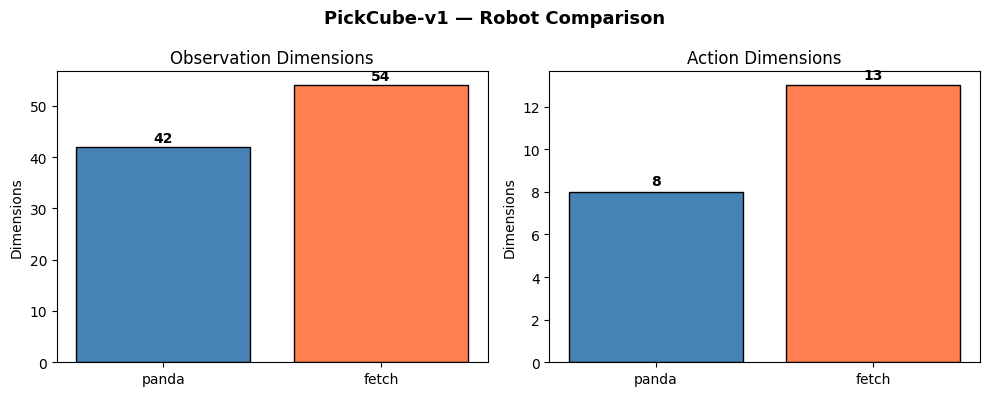

In [33]:
# Visualize dimension comparison
if len(robot_info) >= 2:
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    robots = list(robot_info.keys())

    obs_dims = [robot_info[r]["obs_dim"] for r in robots]
    axes[0].bar(robots, obs_dims, color=["steelblue", "coral"], edgecolor="black")
    axes[0].set_title("Observation Dimensions")
    axes[0].set_ylabel("Dimensions")
    for i, v in enumerate(obs_dims):
        axes[0].text(i, v + 1, str(v), ha="center", fontweight="bold")

    act_dims = [robot_info[r]["act_dim"] for r in robots]
    axes[1].bar(robots, act_dims, color=["steelblue", "coral"], edgecolor="black")
    axes[1].set_title("Action Dimensions")
    axes[1].set_ylabel("Dimensions")
    for i, v in enumerate(act_dims):
        axes[1].text(i, v + 0.3, str(v), ha="center", fontweight="bold")

    fig.suptitle("PickCube-v1 — Robot Comparison", fontsize=13, fontweight="bold")
    fig.tight_layout()
    plt.show()

---
## ส่วนที่ 17: ตัวอย่างที่ 9 — Locomotion: HopperHop

**MS-HopperHop-v1**: ควบคุม Hopper robot ให้กระโดดไปข้างหน้า
เป็นตัวอย่าง locomotion task ที่คล้ายกับ dm_control

### อธิบาย Environment

**Hopper คืออะไร?**
- หุ่นยนต์ **ขาเดียว** (1-legged robot) ที่ต้องกระโดดไปข้างหน้า
- เป็น classic locomotion benchmark จาก **dm_control / MuJoCo**
- ManiSkill port มาเป็น GPU parallelized version

**Observation Space** — `env.observation_space.shape → (15,)`
```
[ torso_height      ← ความสูงของลำตัว
  torso_angle        ← มุมเอียงของลำตัว
  joint_angles (3)   ← มุมข้อต่อ (hip, knee, ankle)
  velocities (6)     ← ความเร็วเชิงเส้น + เชิงมุม
  ... ]
```

**Action Space** — `env.action_space.shape → (3,)`
```
action = [ hip_torque,   ← แรงบิดข้อสะโพก
           knee_torque,   ← แรงบิดข้อเข่า
           ankle_torque ] ← แรงบิดข้อเท้า
```

**Reward:**
- ได้ reward เมื่อ **เคลื่อนที่ไปข้างหน้า** (forward velocity)
- หัก reward เมื่อ **ใช้แรงมาก** (energy penalty)
- หัก reward เมื่อ **ล้ม** (termination penalty)

2026-02-28 02:39:38,743 - mani_skill  - WARNING - No initial pose set for articulation builder of hopper, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.
2026-02-28 02:39:38,746 - mani_skill  - WARNING - No initial pose set for actor builder of None-actor-0, setting to default pose q=[1,0,0,0], p=[0,0,0]. Not setting reasonable initial poses may slow down simulation, see https://github.com/haosulab/ManiSkill/issues/421.
2026-02-28 02:39:38,747 - mani_skill  - WARNING - No initial pose set for actor builder of wall, setting to default pose q=[1,0,0,0], p=[0,0,0]. Not setting reasonable initial poses may slow down simulation, see https://github.com/haosulab/ManiSkill/issues/421.


  Observation space : (15,)
  Action space      : (4,)


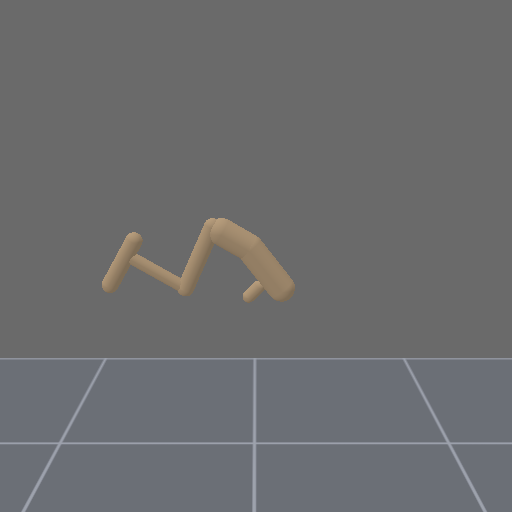

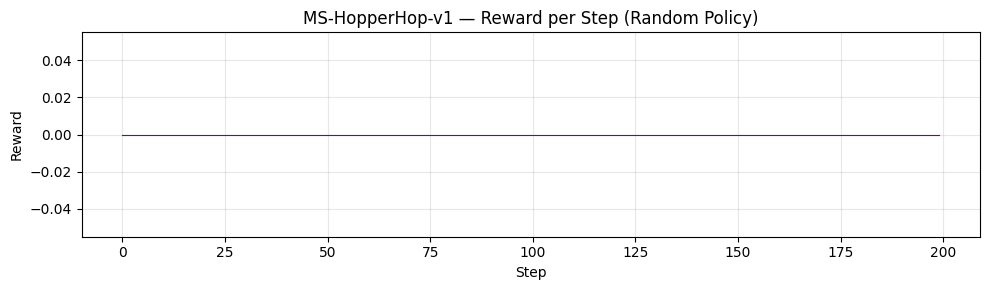

In [34]:
try:
    env = make_env("MS-HopperHop-v1", obs_mode="state")
    obs, info = env.reset(seed=0)

    print(f"  Observation space : {env.observation_space.shape}")
    print(f"  Action space      : {env.action_space.shape}")

    img = render_frame(env)
    display(img)

    frames, rewards_hop, _ = run_and_collect(env, n_steps=200)
    show_video(frames, fps=30)

    fig, ax = plt.subplots(figsize=(10, 3))
    ax.plot(rewards_hop, linewidth=0.8, color="purple")
    ax.set_xlabel("Step")
    ax.set_ylabel("Reward")
    ax.set_title("MS-HopperHop-v1 — Reward per Step (Random Policy)")
    ax.grid(True, alpha=0.3)
    fig.tight_layout()
    plt.show()
    env.close()
except Exception as e:
    print(f"⚠️ HopperHop ไม่สามารถรันได้: {e}")

---
## ส่วนที่ 18: ตัวอย่างที่ 10 — 🦾 Humanoid: UnitreeG1PlaceAppleInBowl

**UnitreeG1PlaceAppleInBowl-v1** เป็น environment ที่ใช้หุ่นยนต์ **Unitree G1 Humanoid**
ซึ่งเป็นหุ่นยนต์รูปร่างคล้ายมนุษย์ มีแขน-ขา-ลำตัวครบ

**Task**: หุ่นยนต์ต้องหยิบแอปเปิลแล้ววางลงในชาม

สิ่งที่น่าสนใจ:
- หุ่นยนต์มี **degrees of freedom สูง** (หลายข้อต่อ) → action space ใหญ่
- ต้อง **ทรงตัว** (balance) ขณะหยิบของ
- เป็นตัวอย่างของ **whole-body manipulation** ที่ซับซ้อน
- ใช้ Unitree G1 ซึ่งเป็นหุ่นยนต์ humanoid จริงที่วางจำหน่าย

### อธิบาย Environment

**Unitree G1 Humanoid:**
- หุ่นยนต์ humanoid ความสูง ~127 cm, น้ำหนัก ~35 kg
- มี **23+ DOF** — ขา 2 ข้าง, แขน 2 ข้าง, ลำตัว, มือ
- เป็นหุ่นยนต์จริงที่ขายในตลาด (ราคา ~$16,000)

**Observation Space** — ใหญ่มาก (~60-80+ dims)
```
[ torso_orientation (4)    ← quaternion ของลำตัว
  torso_angular_vel (3)    ← ความเร็วเชิงมุมลำตัว
  joint_positions (23+)    ← มุมข้อต่อทั้งตัว (ขา, แขน, ลำตัว)
  joint_velocities (23+)   ← ความเร็วข้อต่อ
  apple_position (3)       ← ตำแหน่งแอปเปิล
  bowl_position (3)        ← ตำแหน่งชาม
  hand_positions (6)       ← ตำแหน่งมือซ้าย-ขวา
  ... ]
```

**Action Space** — ใหญ่มาก (~23+ dims)
```
action = [ left_leg_joints...,   ← ควบคุมขาซ้าย
           right_leg_joints...,   ← ควบคุมขาขวา
           torso_joint,           ← ควบคุมลำตัว
           left_arm_joints...,    ← ควบคุมแขนซ้าย
           right_arm_joints...,   ← ควบคุมแขนขวา
           hand_joints... ]       ← ควบคุมนิ้วมือ
```

**ทำไมยากมาก?**
- ต้อง **balance** ตลอดเวลา — ล้มง่าย
- ต้อง **coordinate** ทั้งตัว — ขาทรงตัว + แขนหยิบของ
- action space ใหญ่ → **exploration** ยากมากสำหรับ RL

In [35]:
# 18.1 Download assets สำหรับ Humanoid environment
print("📥 Downloading Unitree G1 humanoid assets...")
download_asset("UnitreeG1PlaceAppleInBowl-v1")
print("✅ Download humanoid assets เสร็จสิ้น")

📥 Downloading Unitree G1 humanoid assets...
✅ Download humanoid assets เสร็จสิ้น


  UnitreeG1PlaceAppleInBowl-v1 — Humanoid Environment
  Observation space : (74,)
  Action space      : (25,)
  Obs dim           : 74
  Action low  (3)   : [-1. -1. -1.]
  Action high (3)   : [1. 1. 1.]


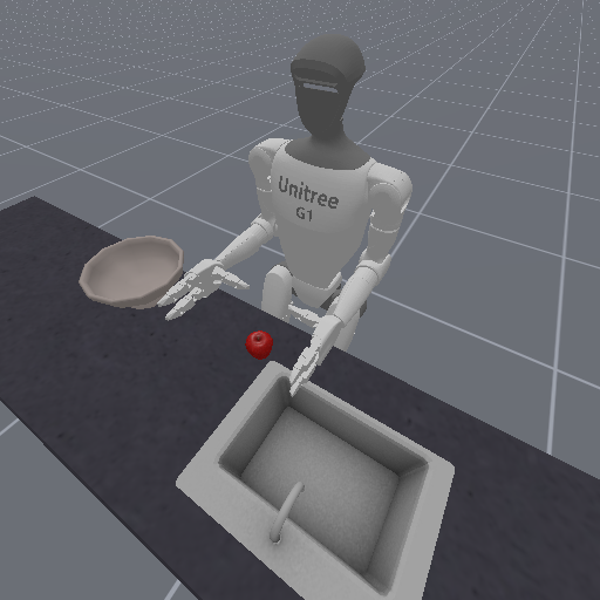

In [36]:
# 18.2 สร้าง Humanoid environment และ render ภาพเริ่มต้น
try:
    env_humanoid = make_env(
        "UnitreeG1PlaceAppleInBowl-v1",
        obs_mode="state",
    )
    obs_h, info_h = env_humanoid.reset(seed=0)

    print("=" * 60)
    print("  UnitreeG1PlaceAppleInBowl-v1 — Humanoid Environment")
    print("=" * 60)
    print(f"  Observation space : {env_humanoid.observation_space.shape}")
    print(f"  Action space      : {env_humanoid.action_space.shape}")
    if hasattr(obs_h, "shape"):
        print(f"  Obs dim           : {obs_h.shape[0]}")
    print(f"  Action low  (3)   : {env_humanoid.action_space.low[:3].round(3)}")
    print(f"  Action high (3)   : {env_humanoid.action_space.high[:3].round(3)}")
    print("=" * 60)

    img_h = render_frame(env_humanoid, width=600, height=600)
    display(img_h)

except Exception as e:
    print(f"⚠️ UnitreeG1PlaceAppleInBowl: {e}")
    env_humanoid = None

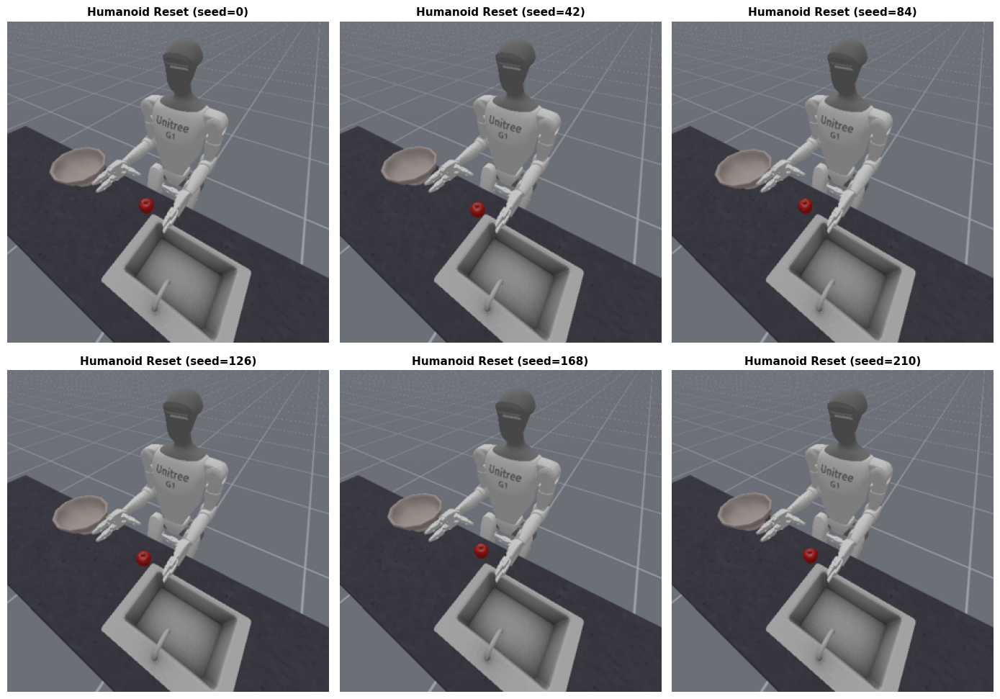

   Each reset randomizes apple and bowl positions


In [37]:
# 18.3 แสดง Humanoid จากหลาย seed เพื่อดู reset distribution
if env_humanoid is not None:
    h_images = []
    h_titles = []
    for seed in range(6):
        try:
            env_humanoid.reset(seed=seed * 42)
            img = render_frame(env_humanoid, width=300, height=300)
            h_images.append(np.array(img))
            h_titles.append(f"Humanoid Reset (seed={seed*42})")
        except Exception:
            pass

    if h_images:
        show_grid(h_images, titles=h_titles, cols=3, figsize=(14, 10))
        print("   Each reset randomizes apple and bowl positions")

In [38]:
# 18.4 รัน random policy บน Humanoid แล้วแสดงวิดีโอ
if env_humanoid is not None:
    try:
        env_humanoid.reset(seed=0)
        frames_h, rewards_h, _ = run_and_collect(env_humanoid, n_steps=200)
        print(f"🎬 Humanoid: Collected {len(frames_h)} frames")
        show_video(frames_h, fps=20)
    except Exception as e:
        print(f"⚠️ Humanoid video: {e}")
        rewards_h = []

🎬 Humanoid: Collected 201 frames


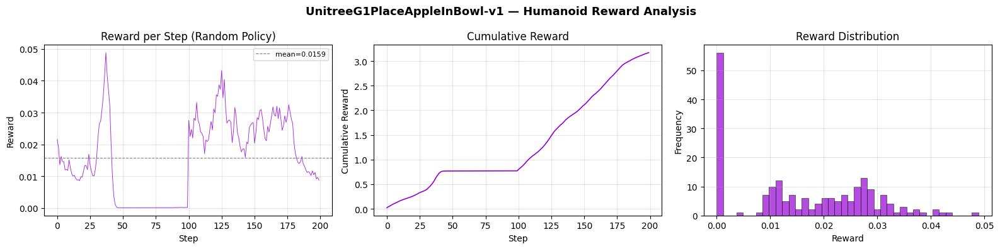

  Total reward  : 3.1701
  Mean reward   : 0.0159
  Std reward    : 0.0124
  Max reward    : 0.0489
  Min reward    : 0.0000


In [39]:
# 18.5 วิเคราะห์ Reward ของ Humanoid
if env_humanoid is not None and len(rewards_h) > 0:
    fig, axes = plt.subplots(1, 3, figsize=(16, 4))

    # Reward per step
    axes[0].plot(rewards_h, linewidth=0.7, color="darkviolet", alpha=0.8)
    mean_rh = np.mean(rewards_h)
    axes[0].axhline(mean_rh, color="gray", ls="--", lw=0.8,
                    label=f"mean={mean_rh:.4f}")
    axes[0].set_xlabel("Step")
    axes[0].set_ylabel("Reward")
    axes[0].set_title("Reward per Step (Random Policy)")
    axes[0].legend(fontsize=8)
    axes[0].grid(True, alpha=0.3)

    # Cumulative reward
    axes[1].plot(np.cumsum(rewards_h), linewidth=1.2, color="darkviolet")
    axes[1].set_xlabel("Step")
    axes[1].set_ylabel("Cumulative Reward")
    axes[1].set_title("Cumulative Reward")
    axes[1].grid(True, alpha=0.3)

    # Histogram
    axes[2].hist(rewards_h, bins=40, color="darkviolet", edgecolor="black",
                 alpha=0.7, linewidth=0.5)
    axes[2].set_xlabel("Reward")
    axes[2].set_ylabel("Frequency")
    axes[2].set_title("Reward Distribution")
    axes[2].grid(True, alpha=0.3)

    fig.suptitle("UnitreeG1PlaceAppleInBowl-v1 — Humanoid Reward Analysis",
                 fontsize=13, fontweight="bold")
    fig.tight_layout()
    plt.show()

    print(f"  Total reward  : {np.sum(rewards_h):.4f}")
    print(f"  Mean reward   : {np.mean(rewards_h):.4f}")
    print(f"  Std reward    : {np.std(rewards_h):.4f}")
    print(f"  Max reward    : {np.max(rewards_h):.4f}")
    print(f"  Min reward    : {np.min(rewards_h):.4f}")

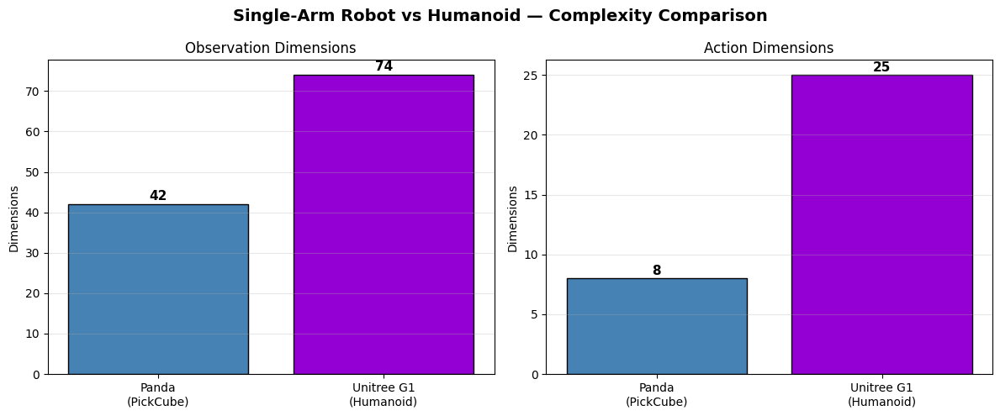

  Humanoid มี DOF สูงกว่ามาก ทำให้ action space ใหญ่และเรียนรู้ยากกว่า


In [40]:
# 18.6 เปรียบเทียบ action space: Humanoid vs Panda (single-arm)
if env_humanoid is not None:
    env_panda_cmp = make_env("PickCube-v1", obs_mode="state",
                             control_mode="pd_joint_delta_pos")
    obs_p, _ = env_panda_cmp.reset(seed=0)

    comparison = {
        "Panda\n(PickCube)": {
            "obs": obs_p.shape[0] if hasattr(obs_p, "shape") else 0,
            "act": env_panda_cmp.action_space.shape[0],
        },
        "Unitree G1\n(Humanoid)": {
            "obs": obs_h.shape[0] if hasattr(obs_h, "shape") else 0,
            "act": env_humanoid.action_space.shape[0],
        },
    }
    env_panda_cmp.close()

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    robot_names = list(comparison.keys())
    colors_cmp = ["steelblue", "darkviolet"]

    obs_vals = [comparison[r]["obs"] for r in robot_names]
    bars1 = axes[0].bar(robot_names, obs_vals, color=colors_cmp, edgecolor="black")
    axes[0].set_title("Observation Dimensions", fontsize=12)
    axes[0].set_ylabel("Dimensions")
    axes[0].grid(axis="y", alpha=0.3)
    for b, v in zip(bars1, obs_vals):
        axes[0].text(b.get_x() + b.get_width()/2, b.get_height() + 1,
                     str(v), ha="center", fontweight="bold", fontsize=11)

    act_vals = [comparison[r]["act"] for r in robot_names]
    bars2 = axes[1].bar(robot_names, act_vals, color=colors_cmp, edgecolor="black")
    axes[1].set_title("Action Dimensions", fontsize=12)
    axes[1].set_ylabel("Dimensions")
    axes[1].grid(axis="y", alpha=0.3)
    for b, v in zip(bars2, act_vals):
        axes[1].text(b.get_x() + b.get_width()/2, b.get_height() + 0.3,
                     str(v), ha="center", fontweight="bold", fontsize=11)

    fig.suptitle("Single-Arm Robot vs Humanoid — Complexity Comparison",
                 fontsize=14, fontweight="bold")
    fig.tight_layout()
    plt.show()

    print("  Humanoid มี DOF สูงกว่ามาก ทำให้ action space ใหญ่และเรียนรู้ยากกว่า")

if env_humanoid is not None:
    env_humanoid.close()

---
## ส่วนที่ 19: ตัวอย่างที่ 11 — 🎨 Drawing: DrawTriangle & DrawSVG

**DrawTriangle-v1** และ **DrawSVG-v1** เป็น environment ที่หุ่นยนต์ต้อง **วาดรูป**
โดยใช้ end-effector เป็น "ปากกา" เลื่อนบนพื้นผิว

สิ่งที่น่าสนใจ:
- **DrawTriangle-v1**: วาดรูปสามเหลี่ยมบนพื้นผิว
- **DrawSVG-v1**: วาดตาม SVG path (ยากกว่ามาก — ต้องวาดรูปที่ซับซ้อน)
- ใช้ **trajectory following** — หุ่นยนต์ต้องเคลื่อนที่ตามเส้นทาง
- Reward จะวัดจาก **ความใกล้เคียง** ของเส้นที่วาดกับเส้นเป้าหมาย
- เป็นตัวอย่างของ **fine motor control** ที่ต้องการความแม่นยำสูง

In [41]:
# 19.1 Download assets สำหรับ Drawing environments
print("📥 Downloading Drawing task assets...")
for eid in ["DrawTriangle-v1", "DrawSVG-v1"]:
    try:
        download_asset(eid)
        print(f"   ✅ {eid}")
    except Exception:
        print(f"   ℹ️  {eid} — no extra assets needed or download skipped")
print("✅ Download drawing assets เสร็จสิ้น")

📥 Downloading Drawing task assets...
   ✅ DrawTriangle-v1
   ✅ DrawSVG-v1
✅ Download drawing assets เสร็จสิ้น


### 19A: DrawTriangle-v1 — วาดสามเหลี่ยม

หุ่นยนต์ต้องเลื่อน end-effector ให้เป็นรูปสามเหลี่ยม
Reward จะมากขึ้นเมื่อวาดได้ใกล้เคียงกับสามเหลี่ยมเป้าหมาย

  DrawTriangle-v1 — Drawing Environment
  Observation space : (49,)
  Action space      : (7,)
  Obs dim           : 49
  Action low  (3)   : [-1. -1. -1.]
  Action high (3)   : [1. 1. 1.]


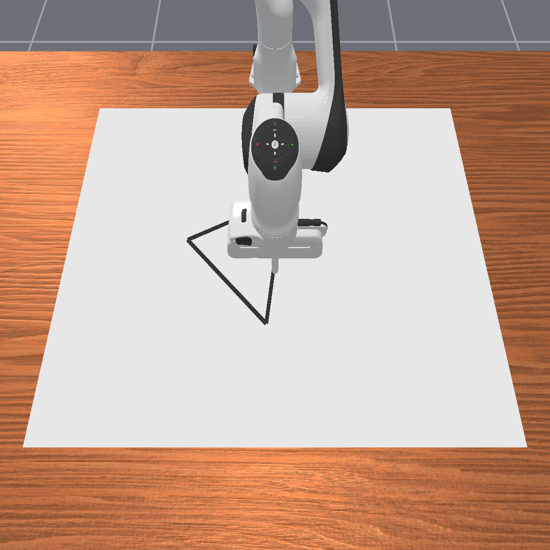

In [42]:
# 19.2 สร้าง DrawTriangle environment
env_triangle = None
try:
    env_triangle = make_env("DrawTriangle-v1", obs_mode="state")
    obs_tri, info_tri = env_triangle.reset(seed=0)

    print("=" * 60)
    print("  DrawTriangle-v1 — Drawing Environment")
    print("=" * 60)
    print(f"  Observation space : {env_triangle.observation_space.shape}")
    print(f"  Action space      : {env_triangle.action_space.shape}")
    if hasattr(obs_tri, "shape"):
        print(f"  Obs dim           : {obs_tri.shape[0]}")
    print(f"  Action low  (3)   : {env_triangle.action_space.low[:3].round(3)}")
    print(f"  Action high (3)   : {env_triangle.action_space.high[:3].round(3)}")
    print("=" * 60)

    img_tri = render_frame(env_triangle, width=550, height=550)
    display(img_tri)

except Exception as e:
    print(f"⚠️ DrawTriangle-v1: {e}")

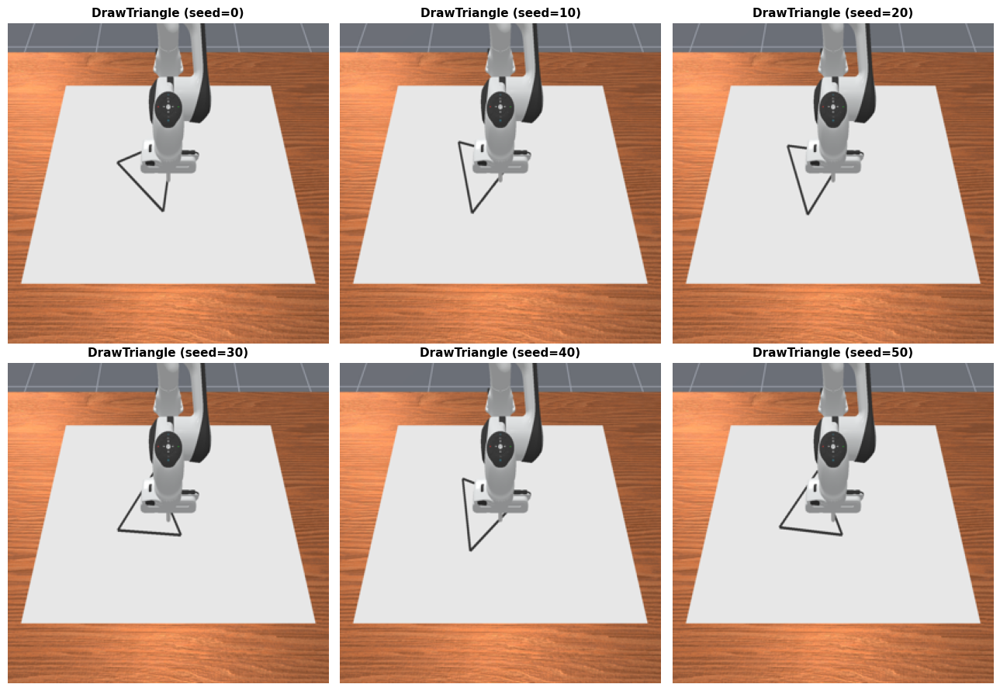

   Target triangle shape may vary across seeds


In [43]:
# 19.3 แสดง DrawTriangle จากหลาย seed เพื่อดู reset distribution
if env_triangle is not None:
    tri_images = []
    tri_titles = []
    for seed in range(6):
        try:
            env_triangle.reset(seed=seed * 10)
            img = render_frame(env_triangle, width=280, height=280)
            tri_images.append(np.array(img))
            tri_titles.append(f"DrawTriangle (seed={seed*10})")
        except Exception:
            pass

    if tri_images:
        show_grid(tri_images, titles=tri_titles, cols=3, figsize=(13, 9))
        print("   Target triangle shape may vary across seeds")

In [44]:
# 19.4 รัน random policy บน DrawTriangle แล้วแสดงวิดีโอ
if env_triangle is not None:
    try:
        env_triangle.reset(seed=0)
        frames_tri, rewards_tri, _ = run_and_collect(env_triangle, n_steps=250)
        print(f"🎬 DrawTriangle: Collected {len(frames_tri)} frames")
        show_video(frames_tri, fps=20)
    except Exception as e:
        print(f"⚠️ DrawTriangle video: {e}")
        rewards_tri = []

🎬 DrawTriangle: Collected 251 frames


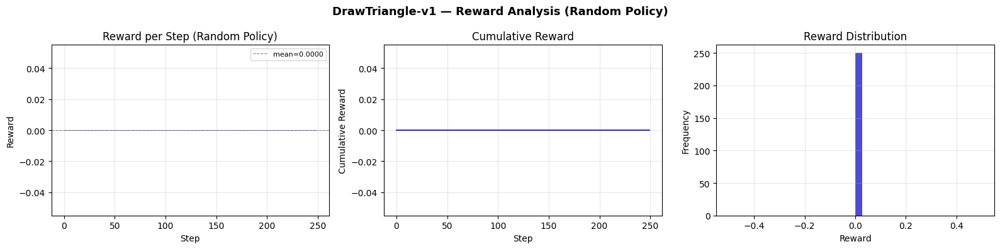

  Total reward  : 0.0000
  Mean reward   : 0.0000
  Std reward    : 0.0000


In [45]:
# 19.5 วิเคราะห์ Reward ของ DrawTriangle
if env_triangle is not None and len(rewards_tri) > 0:
    fig, axes = plt.subplots(1, 3, figsize=(16, 4))

    # Reward per step
    axes[0].plot(rewards_tri, linewidth=0.7, color="mediumblue", alpha=0.8)
    mean_rt = np.mean(rewards_tri)
    axes[0].axhline(mean_rt, color="gray", ls="--", lw=0.8,
                    label=f"mean={mean_rt:.4f}")
    axes[0].set_xlabel("Step")
    axes[0].set_ylabel("Reward")
    axes[0].set_title("Reward per Step (Random Policy)")
    axes[0].legend(fontsize=8)
    axes[0].grid(True, alpha=0.3)

    # Cumulative reward
    axes[1].plot(np.cumsum(rewards_tri), linewidth=1.2, color="mediumblue")
    axes[1].set_xlabel("Step")
    axes[1].set_ylabel("Cumulative Reward")
    axes[1].set_title("Cumulative Reward")
    axes[1].grid(True, alpha=0.3)

    # Histogram
    axes[2].hist(rewards_tri, bins=40, color="mediumblue", edgecolor="black",
                 alpha=0.7, linewidth=0.5)
    axes[2].set_xlabel("Reward")
    axes[2].set_ylabel("Frequency")
    axes[2].set_title("Reward Distribution")
    axes[2].grid(True, alpha=0.3)

    fig.suptitle("DrawTriangle-v1 — Reward Analysis (Random Policy)",
                 fontsize=13, fontweight="bold")
    fig.tight_layout()
    plt.show()

    print(f"  Total reward  : {np.sum(rewards_tri):.4f}")
    print(f"  Mean reward   : {np.mean(rewards_tri):.4f}")
    print(f"  Std reward    : {np.std(rewards_tri):.4f}")

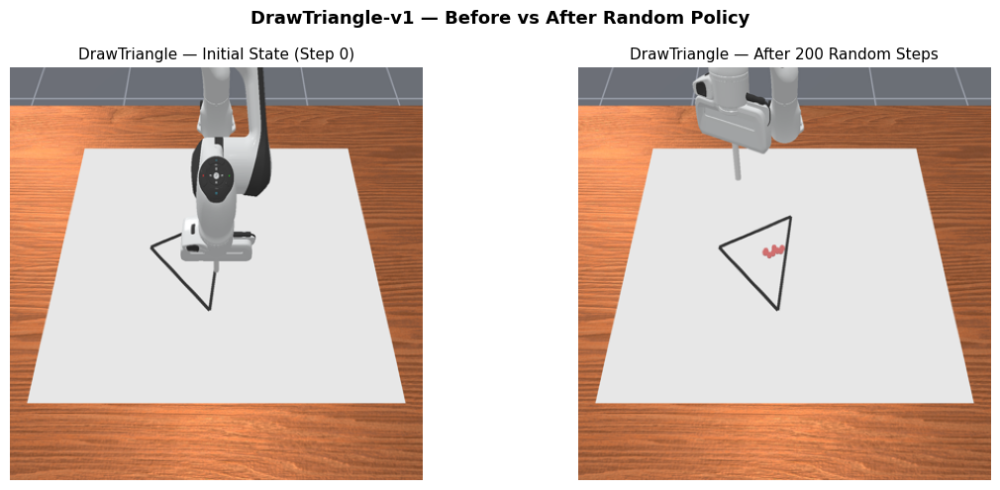

   Random policy วาดรูปไม่เป็นรูปร่าง — ต้องใช้ trained policy จึงจะวาดได้ถูก


In [46]:
# 19.6 แสดงภาพ before vs after (random policy) ของ DrawTriangle
if env_triangle is not None:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Before: initial state
    env_triangle.reset(seed=0)
    img_before = render_frame(env_triangle, width=400, height=400)
    axes[0].imshow(np.array(img_before))
    axes[0].set_title("DrawTriangle — Initial State (Step 0)", fontsize=11)
    axes[0].axis("off")

    # After: run some random steps
    for _ in range(200):
        action = env_triangle.action_space.sample()
        obs, reward, terminated, truncated, info = env_triangle.step(action)
        if terminated or truncated:
            break
    img_after = render_frame(env_triangle, width=400, height=400)
    axes[1].imshow(np.array(img_after))
    axes[1].set_title("DrawTriangle — After 200 Random Steps", fontsize=11)
    axes[1].axis("off")

    fig.suptitle("DrawTriangle-v1 — Before vs After Random Policy",
                 fontsize=13, fontweight="bold")
    fig.tight_layout()
    plt.show()
    print("   Random policy วาดรูปไม่เป็นรูปร่าง — ต้องใช้ trained policy จึงจะวาดได้ถูก")

if env_triangle is not None:
    env_triangle.close()

### 19B: DrawSVG-v1 — วาดตาม SVG Path

**DrawSVG-v1** เป็น environment ที่ยากกว่า DrawTriangle มาก
หุ่นยนต์ต้องวาดตาม **SVG path** ที่ซับซ้อน เช่น ตัวอักษร รูปทรง หรือไอคอน
เป็นตัวอย่างของ **generalization** — ต้อง generalize ไปยังรูปทรงใหม่ที่ไม่เคยเห็น

In [47]:
# 19.7 สร้าง DrawSVG environment
env_svg = None
try:
    env_svg = make_env("DrawSVG-v1", obs_mode="state")
    obs_svg, info_svg = env_svg.reset(seed=0)

    print("=" * 60)
    print("  DrawSVG-v1 — SVG Drawing Environment")
    print("=" * 60)
    print(f"  Observation space : {env_svg.observation_space.shape}")
    print(f"  Action space      : {env_svg.action_space.shape}")
    if hasattr(obs_svg, "shape"):
        print(f"  Obs dim           : {obs_svg.shape[0]}")
    print(f"  Action low  (3)   : {env_svg.action_space.low[:3].round(3)}")
    print(f"  Action high (3)   : {env_svg.action_space.high[:3].round(3)}")
    print("=" * 60)

    img_svg = render_frame(env_svg, width=550, height=550)
    display(img_svg)

except Exception as e:
    print(f"⚠️ DrawSVG-v1: {e}")

2026-02-28 02:39:48,441 - mani_skill  - WARNING - No initial pose set for articulation builder of panda_stick, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.


⚠️ DrawSVG-v1: svgpathtools not installed. Install with pip install svgpathtools


In [48]:
# 19.8 แสดง DrawSVG จากหลาย seed — ดู SVG path ที่แตกต่างกัน
if env_svg is not None:
    svg_images = []
    svg_titles = []
    for seed in range(9):
        try:
            env_svg.reset(seed=seed)
            img = render_frame(env_svg, width=250, height=250)
            svg_images.append(np.array(img))
            svg_titles.append(f"DrawSVG (seed={seed})")
        except Exception:
            pass

    if svg_images:
        show_grid(svg_images, titles=svg_titles, cols=3, figsize=(13, 13))
        print("   Different SVG paths appear for each seed — heterogeneous targets!")

In [49]:
# 19.9 รัน random policy บน DrawSVG แล้วแสดงวิดีโอ
if env_svg is not None:
    try:
        env_svg.reset(seed=0)
        frames_svg, rewards_svg, _ = run_and_collect(env_svg, n_steps=250)
        print(f"🎬 DrawSVG: Collected {len(frames_svg)} frames")
        show_video(frames_svg, fps=20)
    except Exception as e:
        print(f"⚠️ DrawSVG video: {e}")
        rewards_svg = []

In [50]:
# 19.10 วิเคราะห์ Reward ของ DrawSVG
if env_svg is not None and len(rewards_svg) > 0:
    fig, axes = plt.subplots(1, 3, figsize=(16, 4))

    axes[0].plot(rewards_svg, linewidth=0.7, color="darkcyan", alpha=0.8)
    mean_rs = np.mean(rewards_svg)
    axes[0].axhline(mean_rs, color="gray", ls="--", lw=0.8,
                    label=f"mean={mean_rs:.4f}")
    axes[0].set_xlabel("Step")
    axes[0].set_ylabel("Reward")
    axes[0].set_title("Reward per Step (Random Policy)")
    axes[0].legend(fontsize=8)
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(np.cumsum(rewards_svg), linewidth=1.2, color="darkcyan")
    axes[1].set_xlabel("Step")
    axes[1].set_ylabel("Cumulative Reward")
    axes[1].set_title("Cumulative Reward")
    axes[1].grid(True, alpha=0.3)

    axes[2].hist(rewards_svg, bins=40, color="darkcyan", edgecolor="black",
                 alpha=0.7, linewidth=0.5)
    axes[2].set_xlabel("Reward")
    axes[2].set_ylabel("Frequency")
    axes[2].set_title("Reward Distribution")
    axes[2].grid(True, alpha=0.3)

    fig.suptitle("DrawSVG-v1 — Reward Analysis (Random Policy)",
                 fontsize=13, fontweight="bold")
    fig.tight_layout()
    plt.show()

    print(f"  Total reward  : {np.sum(rewards_svg):.4f}")
    print(f"  Mean reward   : {np.mean(rewards_svg):.4f}")
    print(f"  Std reward    : {np.std(rewards_svg):.4f}")

In [51]:
# 19.11 เปรียบเทียบ DrawTriangle vs DrawSVG
drawing_comparison = {}

for eid, label, color in [
    ("DrawTriangle-v1", "DrawTriangle", "mediumblue"),
    ("DrawSVG-v1",      "DrawSVG",      "darkcyan"),
]:
    try:
        env = make_env(eid, obs_mode="state")
        obs, _ = env.reset(seed=0)
        _, rews, _ = run_and_collect(env, n_steps=200)
        drawing_comparison[label] = {
            "rewards": rews,
            "obs_dim": obs.shape[0] if hasattr(obs, "shape") else 0,
            "act_dim": env.action_space.shape[0],
            "color": color,
        }
        env.close()
    except Exception as e:
        print(f"  ⚠️ {eid}: {e}")

if len(drawing_comparison) >= 2:
    fig, axes = plt.subplots(1, 3, figsize=(16, 4.5))

    # Reward overlay
    for label, data in drawing_comparison.items():
        axes[0].plot(data["rewards"], label=label, linewidth=0.7,
                     color=data["color"], alpha=0.85)
    axes[0].set_xlabel("Step")
    axes[0].set_ylabel("Reward")
    axes[0].set_title("Reward Comparison — Drawing Tasks")
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Cumulative
    for label, data in drawing_comparison.items():
        axes[1].plot(np.cumsum(data["rewards"]), label=label, linewidth=1.2,
                     color=data["color"])
    axes[1].set_xlabel("Step")
    axes[1].set_ylabel("Cumulative Reward")
    axes[1].set_title("Cumulative Reward — Drawing Tasks")
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    # Space dimensions
    labels = list(drawing_comparison.keys())
    obs_d = [drawing_comparison[l]["obs_dim"] for l in labels]
    act_d = [drawing_comparison[l]["act_dim"] for l in labels]
    x = np.arange(len(labels))
    w = 0.35
    axes[2].bar(x - w/2, obs_d, w, label="Obs dim",
                color="lightsteelblue", edgecolor="black")
    axes[2].bar(x + w/2, act_d, w, label="Act dim",
                color="lightsalmon", edgecolor="black")
    axes[2].set_xticks(x)
    axes[2].set_xticklabels(labels)
    axes[2].set_ylabel("Dimensions")
    axes[2].set_title("Observation / Action Dims")
    axes[2].legend()
    axes[2].grid(axis="y", alpha=0.3)
    for i, (o, a) in enumerate(zip(obs_d, act_d)):
        axes[2].text(i - w/2, o + 0.5, str(o), ha="center", fontsize=9)
        axes[2].text(i + w/2, a + 0.5, str(a), ha="center", fontsize=9)

    fig.suptitle("Drawing Environments — Comparison",
                 fontsize=14, fontweight="bold")
    fig.tight_layout()
    plt.show()

    print("\n  Summary:")
    for label, data in drawing_comparison.items():
        print(f"    {label:15s}  obs_dim={data['obs_dim']}  act_dim={data['act_dim']}  "
              f"mean_reward={np.mean(data['rewards']):.4f}")
    print("\n  DrawSVG ยากกว่า DrawTriangle เพราะ target path ซับซ้อนและเปลี่ยนทุก episode")

if env_svg is not None:
    env_svg.close()

2026-02-28 02:39:49,533 - mani_skill  - WARNING - No initial pose set for articulation builder of panda_stick, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.


  ⚠️ DrawSVG-v1: svgpathtools not installed. Install with pip install svgpathtools


---
## ส่วนที่ 20: Reset Distribution Visualization

การดู reset distribution ช่วยให้เข้าใจความยากของ task
โดยดูว่า object ถูกวางไว้ตำแหน่งไหนบ้างเมื่อ reset

### อธิบาย Reset Distribution

**Reset Distribution คืออะไร?**
- ทุกครั้งที่เรียก `env.reset(seed=N)` → ตำแหน่งเริ่มต้นจะ **สุ่มใหม่**
- seed ต่างกัน → วัตถุอยู่คนละที่, เป้าหมายอยู่คนละที่
- นี่คือ **domain randomization** — ทำให้ policy ต้อง generalize

**ทำไมสำคัญ?**
- ถ้า reset distribution **แคบ** (cube อยู่ที่เดิมตลอด) → policy แค่ memorize ก็ได้
- ถ้า reset distribution **กว้าง** (cube อยู่ได้ทุกที่) → policy ต้อง generalize จริง
- ดู distribution ช่วยประเมินว่า task **ยากแค่ไหน**

**ตัวอย่าง PushCube:**
- cube สุ่มตำแหน่งบนโต๊ะ (x, y ต่างกัน)
- goal สุ่มตำแหน่งบนโต๊ะ (อีกที่หนึ่ง)
- ทำให้ random policy แทบไม่มีวัน push cube ไปถูกเป้าหมาย

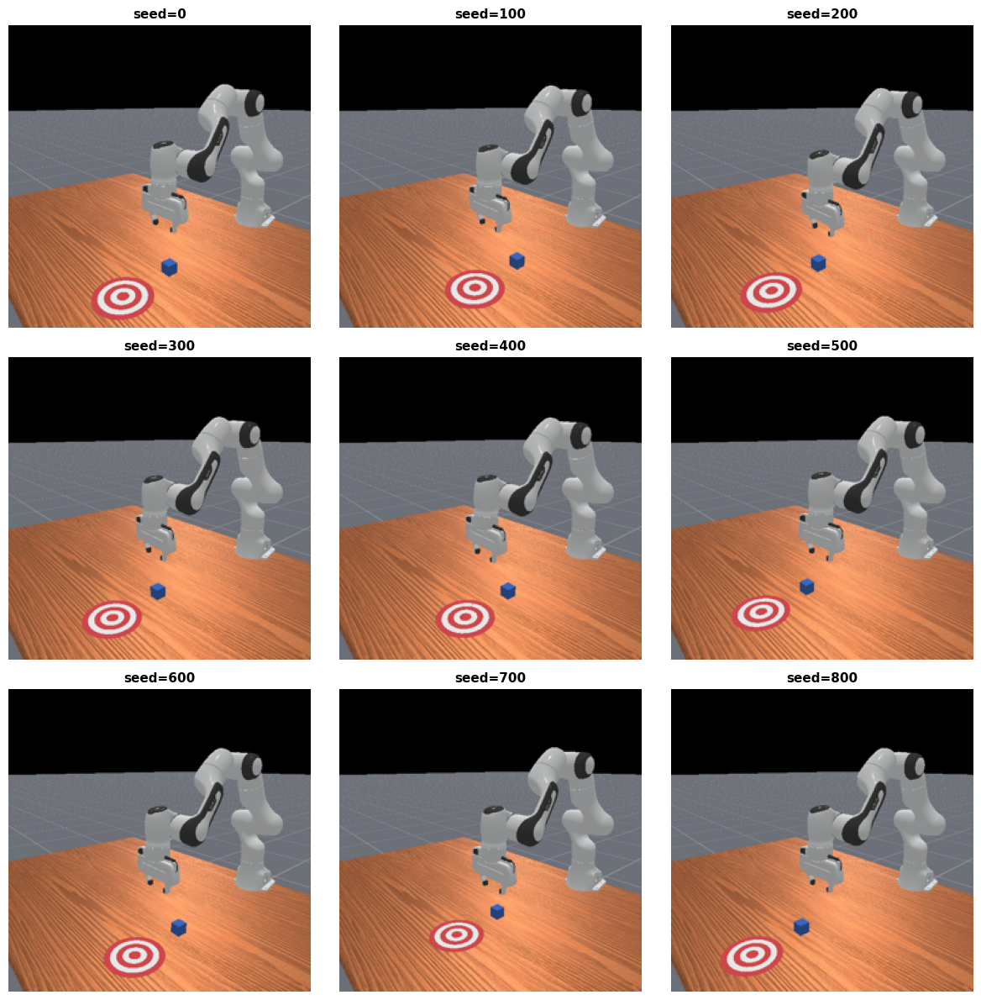

   Notice: cube and goal positions change across episodes


In [52]:
# แสดง reset distribution ของ PushCube
env = make_env("PushCube-v1", obs_mode="state")

reset_images = []
reset_titles = []
for seed in range(9):
    obs, info = env.reset(seed=seed * 100)
    img = render_frame(env, width=250, height=250)
    reset_images.append(np.array(img))
    reset_titles.append(f"seed={seed*100}")

show_grid(reset_images, titles=reset_titles, cols=3, figsize=(12, 12))
env.close()
print("   Notice: cube and goal positions change across episodes")

---
## ส่วนที่ 21: PlugCharger (เสียบปลั๊ก)

**PlugCharger-v1**: แขนกลต้องหยิบ charger plug แล้วเสียบเข้า socket
เป็นอีกหนึ่ง contact-rich task ที่ท้าทาย

### อธิบาย Environment

**PlugCharger คล้ายกับ PegInsertion แต่สมจริงกว่า:**
- ใช้รูปทรง **charger plug จริง** (ไม่ใช่ peg กลมๆ)
- ต้องเสียบ plug ให้ตรง **ทั้ง position และ orientation**
- Socket มีรูเฉพาะ → ต้อง align ให้พอดี

**ความท้าทาย:**
- Contact-rich → physics simulation ซับซ้อน
- Plug มีรูปทรงไม่สมมาตร → ต้องหมุนให้ถูกทาง
- Tight tolerance → เบี่ยงนิดเดียว plug จะไม่เข้า
- เป็น task ที่ใกล้เคียงกับ **real-world industrial automation**

  Observation space : (46,)


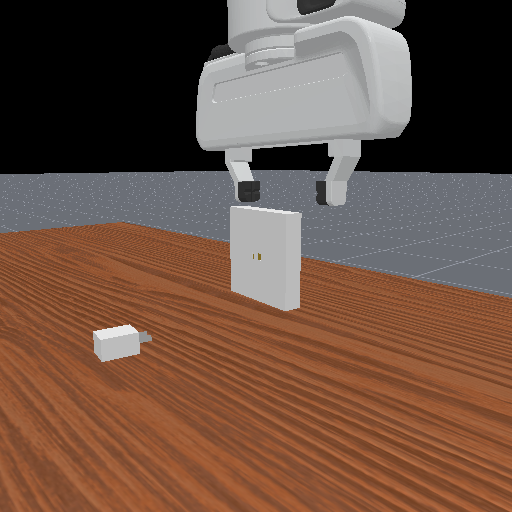

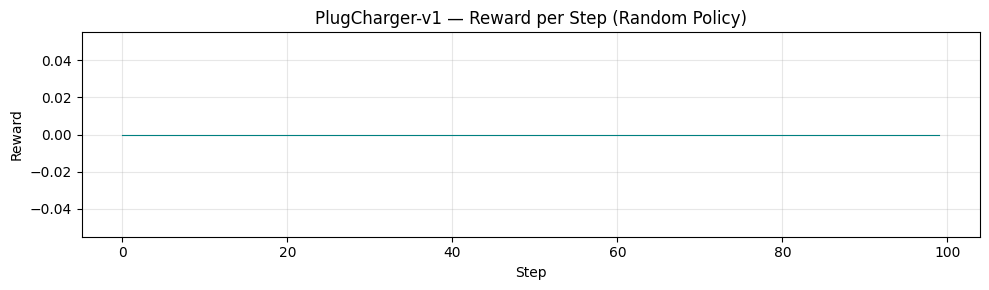

In [53]:
try:
    env = make_env("PlugCharger-v1", obs_mode="state", control_mode="pd_ee_delta_pose")
    obs, info = env.reset(seed=0)

    print(f"  Observation space : {env.observation_space.shape}")
    img = render_frame(env)
    display(img)

    frames, rewards_plug, _ = run_and_collect(env, n_steps=100)
    show_video(frames, fps=20)

    fig, ax = plt.subplots(figsize=(10, 3))
    ax.plot(rewards_plug, linewidth=0.8, color="teal")
    ax.set_xlabel("Step")
    ax.set_ylabel("Reward")
    ax.set_title("PlugCharger-v1 — Reward per Step (Random Policy)")
    ax.grid(True, alpha=0.3)
    fig.tight_layout()
    plt.show()
    env.close()
except Exception as e:
    print(f"⚠️ PlugCharger: {e}")

---
## ส่วนที่ 22: Reward Analysis — เปรียบเทียบ Rewards ทุก Environment

รวม reward curves จากทุก environment ที่เราทดลองไว้ลงกราฟ
รวมทั้ง Humanoid และ Drawing tasks

### อธิบาย Reward Analysis

**ทำไมต้องเปรียบเทียบ Reward?**
- Reward บอก **ความยากของ task** — task ที่ random policy ได้ reward ต่ำ = ยาก
- **Mean reward ใกล้ 0** = random policy แทบทำอะไรไม่ได้ (task ยาก)
- **Mean reward สูง** = random policy ก็ทำได้บ้าง (task ง่ายกว่า)

**Dense vs Sparse Reward:**
- **Dense reward**: ได้ reward ทุก step ตามความใกล้เป้าหมาย (เช่น PushCube)
- **Sparse reward**: ได้ reward เมื่อสำเร็จเท่านั้น (เช่น StackCube, PegInsertion)
- Dense reward → RL เรียนรู้ง่ายกว่า เพราะมี gradient signal ตลอด

**สิ่งที่คาดหวัง (Random Policy):**
- PushCube: reward ต่ำแต่ไม่เป็น 0 (อาจผลักไปใกล้เป้าบ้าง)
- StackCube: reward ต่ำมาก (สุ่มแล้วแทบไม่มีทาง stack ได้)
- Humanoid: reward ต่ำ (สุ่มแล้วหุ่นล้มทันที)

In [54]:
# รวบรวม reward data จากหลาย environments
N_STEPS_COMPARE = 200

env_configs_all = [
    ("PushCube-v1",                     "pd_ee_delta_pose",  "steelblue",    "PushCube"),
    ("PickCube-v1",                     "pd_ee_delta_pose",  "darkorange",   "PickCube"),
    ("StackCube-v1",                    "pd_ee_delta_pose",  "seagreen",     "StackCube"),
    ("PegInsertionSide-v1",             "pd_ee_delta_pose",  "crimson",      "PegInsertion"),
    ("UnitreeG1PlaceAppleInBowl-v1",    None,                "darkviolet",   "Humanoid G1"),
    ("DrawTriangle-v1",                 None,                "mediumblue",   "DrawTriangle"),
    ("DrawSVG-v1",                      None,                "darkcyan",     "DrawSVG"),
]

all_rewards = {}
for env_id, cm, color, label in env_configs_all:
    try:
        if cm:
            env = make_env(env_id, obs_mode="state", control_mode=cm)
        else:
            env = make_env(env_id, obs_mode="state")
        _, rews, _ = run_and_collect(env, n_steps=N_STEPS_COMPARE)
        all_rewards[label] = {"rewards": rews, "color": color}
        env.close()
    except Exception as e:
        print(f"  ⚠️ {env_id}: {e}")

2026-02-28 02:39:56,101 - mani_skill  - WARNING - No initial pose set for articulation builder of panda_stick, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.


  ⚠️ DrawSVG-v1: svgpathtools not installed. Install with pip install svgpathtools


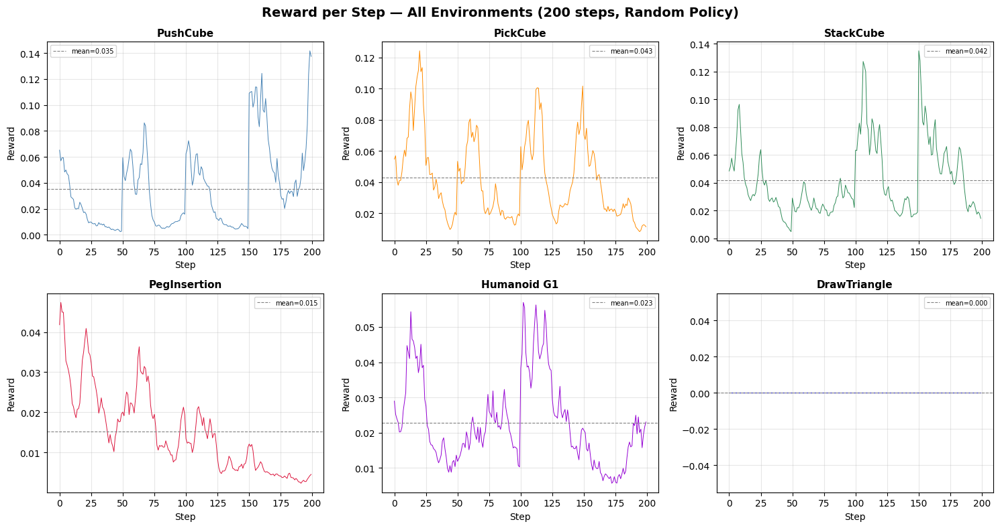

In [55]:
# Plot: Multi-panel reward comparison
n_envs_plot = len(all_rewards)
if n_envs_plot > 0:
    ncols = 3
    nrows = (n_envs_plot + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows))
    axes = np.array(axes).reshape(-1)

    for idx, (label, data) in enumerate(all_rewards.items()):
        rews = data["rewards"]
        color = data["color"]
        axes[idx].plot(rews, linewidth=0.7, color=color)
        mean_r = np.mean(rews)
        axes[idx].axhline(mean_r, color="gray", ls="--", lw=0.8,
                          label=f"mean={mean_r:.3f}")
        axes[idx].set_title(f"{label}", fontsize=11, fontweight="bold")
        axes[idx].set_xlabel("Step")
        axes[idx].set_ylabel("Reward")
        axes[idx].legend(fontsize=7)
        axes[idx].grid(True, alpha=0.3)

    # Hide unused axes
    for idx in range(n_envs_plot, len(axes)):
        axes[idx].axis("off")

    fig.suptitle(f"Reward per Step — All Environments ({N_STEPS_COMPARE} steps, Random Policy)",
                 fontsize=14, fontweight="bold")
    fig.tight_layout()
    plt.show()

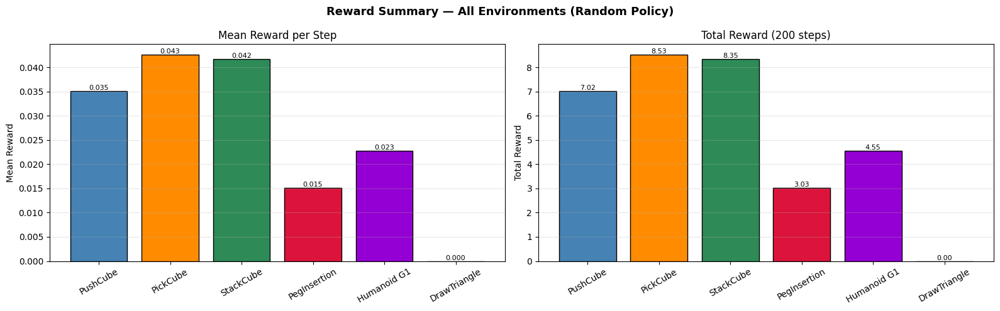

In [56]:
# Summary bar chart — all environments
if all_rewards:
    labels = list(all_rewards.keys())
    means = [np.mean(all_rewards[l]["rewards"]) for l in labels]
    totals = [np.sum(all_rewards[l]["rewards"]) for l in labels]
    colors_bar = [all_rewards[l]["color"] for l in labels]

    fig, axes = plt.subplots(1, 2, figsize=(16, 5))

    bars1 = axes[0].bar(labels, means, color=colors_bar, edgecolor="black")
    axes[0].set_title("Mean Reward per Step", fontsize=12)
    axes[0].set_ylabel("Mean Reward")
    axes[0].grid(axis="y", alpha=0.3)
    axes[0].tick_params(axis="x", rotation=30)
    for b, v in zip(bars1, means):
        axes[0].text(b.get_x() + b.get_width()/2, b.get_height(),
                     f"{v:.3f}", ha="center", va="bottom", fontsize=8)

    bars2 = axes[1].bar(labels, totals, color=colors_bar, edgecolor="black")
    axes[1].set_title(f"Total Reward ({N_STEPS_COMPARE} steps)", fontsize=12)
    axes[1].set_ylabel("Total Reward")
    axes[1].grid(axis="y", alpha=0.3)
    axes[1].tick_params(axis="x", rotation=30)
    for b, v in zip(bars2, totals):
        axes[1].text(b.get_x() + b.get_width()/2, b.get_height(),
                     f"{v:.2f}", ha="center", va="bottom", fontsize=8)

    fig.suptitle("Reward Summary — All Environments (Random Policy)",
                 fontsize=13, fontweight="bold")
    fig.tight_layout()
    plt.show()

---
## ส่วนที่ 23: Benchmark — วัดความเร็ว Simulation

ทดสอบ FPS ของ ManiSkill3 ในโหมดต่างๆ

### อธิบาย Benchmark

**FPS (Frames Per Second) คืออะไรในบริบทนี้?**
- **FPS = จำนวน environment steps ต่อวินาที** (ไม่ใช่ video frames)
- คำนวณจาก: `FPS = (num_envs * n_steps) / elapsed_time`
- ยิ่ง FPS สูง → เก็บข้อมูลสำหรับ RL ได้เร็วขึ้น

**ปัจจัยที่ส่งผล:**
- `num_envs`: ยิ่งเพิ่ม → FPS สูงขึ้น (GPU parallelism)
- `obs_mode="state"`: เร็วมาก (ไม่ต้อง render)
- `obs_mode="rgbd"`: ช้าลง (ต้อง render ภาพทุก step)

**ตัวเลขที่คาดหวัง:**
- State mode, 1 env: ~500-2,000 FPS
- State mode, 16 envs: ~5,000-15,000 FPS
- RGBD mode, 1 env: ~100-500 FPS (ช้ากว่าเพราะต้อง render)
- RGBD mode, 16 envs: ~1,000-5,000 FPS

In [57]:
def benchmark_env(env_id, num_envs, obs_mode="state", n_steps=300):
    """วัด FPS ของ environment"""
    env = gym.make(env_id, num_envs=num_envs, obs_mode=obs_mode)
    env.reset(seed=0)

    # warmup
    for _ in range(10):
        env.step(env.action_space.sample())

    start = time.time()
    for _ in range(n_steps):
        action = env.action_space.sample()
        env.step(action)
    elapsed = time.time() - start

    total_steps = n_steps * num_envs
    fps = total_steps / elapsed
    env.close()
    return fps, elapsed


print("=" * 60)
print("  Benchmark: PushCube-v1 (state-based, no rendering)")
print("=" * 60)

bench_results = {}
for n in [1, 4, 16]:
    try:
        fps, elapsed = benchmark_env("PushCube-v1", num_envs=n, n_steps=200)
        bench_results[n] = fps
        print(f"   num_envs={n:3d}  ->  {fps:>10,.0f} FPS  ({elapsed:.2f}s)")
    except Exception as e:
        print(f"   num_envs={n:3d}  ->  ERROR: {e}")

  Benchmark: PushCube-v1 (state-based, no rendering)
   num_envs=  1  ->       2,189 FPS  (0.09s)
   num_envs=  4  ->  ERROR: GPU PhysX can only be enabled once before any other code involving PhysX
   num_envs= 16  ->  ERROR: GPU PhysX can only be enabled once before any other code involving PhysX


In [58]:
# Benchmark with rendering (RGBD)
print("\n" + "=" * 60)
print("  Benchmark: PushCube-v1 (RGBD mode, with visual obs)")
print("=" * 60)

bench_rgbd = {}
for n in [1, 4, 16]:
    try:
        fps, elapsed = benchmark_env("PushCube-v1", num_envs=n,
                                     obs_mode="rgbd", n_steps=100)
        bench_rgbd[n] = fps
        print(f"   num_envs={n:3d}  ->  {fps:>10,.0f} FPS  ({elapsed:.2f}s)")
    except Exception as e:
        print(f"   num_envs={n:3d}  ->  ERROR: {e}")


  Benchmark: PushCube-v1 (RGBD mode, with visual obs)
   num_envs=  1  ->         559 FPS  (0.18s)
   num_envs=  4  ->  ERROR: GPU PhysX can only be enabled once before any other code involving PhysX
   num_envs= 16  ->  ERROR: GPU PhysX can only be enabled once before any other code involving PhysX


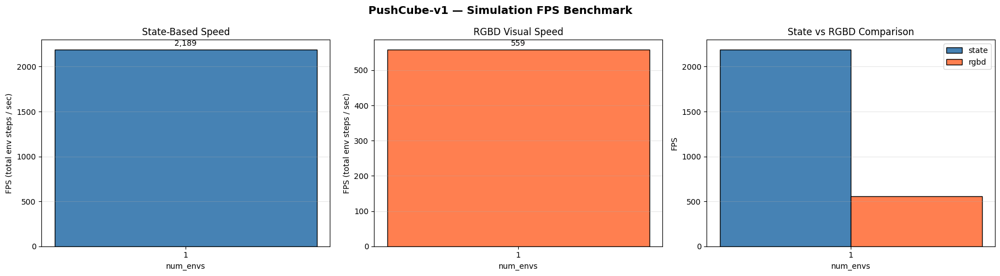

In [59]:
# Visualize benchmark results
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

if bench_results:
    x = list(bench_results.keys())
    y = list(bench_results.values())
    axes[0].bar([str(v) for v in x], y, color="steelblue", edgecolor="black")
    axes[0].set_xlabel("num_envs")
    axes[0].set_ylabel("FPS (total env steps / sec)")
    axes[0].set_title("State-Based Speed")
    axes[0].grid(axis="y", alpha=0.3)
    for i, v in enumerate(y):
        axes[0].text(i, v + max(y)*0.02, f"{v:,.0f}", ha="center", fontsize=10)

if bench_rgbd:
    x = list(bench_rgbd.keys())
    y = list(bench_rgbd.values())
    axes[1].bar([str(v) for v in x], y, color="coral", edgecolor="black")
    axes[1].set_xlabel("num_envs")
    axes[1].set_ylabel("FPS (total env steps / sec)")
    axes[1].set_title("RGBD Visual Speed")
    axes[1].grid(axis="y", alpha=0.3)
    for i, v in enumerate(y):
        axes[1].text(i, v + max(y)*0.02, f"{v:,.0f}", ha="center", fontsize=10)

# Combined comparison
if bench_results and bench_rgbd:
    common_keys = sorted(set(bench_results.keys()) & set(bench_rgbd.keys()))
    if common_keys:
        x = np.arange(len(common_keys))
        width = 0.35
        axes[2].bar(x - width/2, [bench_results[k] for k in common_keys],
                    width, label="state", color="steelblue", edgecolor="black")
        axes[2].bar(x + width/2, [bench_rgbd[k] for k in common_keys],
                    width, label="rgbd", color="coral", edgecolor="black")
        axes[2].set_xlabel("num_envs")
        axes[2].set_ylabel("FPS")
        axes[2].set_title("State vs RGBD Comparison")
        axes[2].set_xticks(x)
        axes[2].set_xticklabels([str(k) for k in common_keys])
        axes[2].legend()
        axes[2].grid(axis="y", alpha=0.3)

fig.suptitle("PushCube-v1 — Simulation FPS Benchmark",
             fontsize=14, fontweight="bold")
fig.tight_layout()
plt.show()

---
## ส่วนที่ 24: Comprehensive Environment Gallery

สร้าง gallery ขนาดใหญ่ แสดง environment ทุกประเภทรวม Humanoid และ Drawing

### อธิบาย Environment Gallery

รวบรวม **ทุก environment ที่ใช้ในแลปนี้** ลงใน gallery เดียว เพื่อเห็นภาพรวม:

| ประเภท | Environments | ลักษณะเด่น |
|---|---|---|
| **Table-Top** | PushCube, PickCube, StackCube, PegInsertion, PlugCharger | แขนกล Panda, manipulation บนโต๊ะ |
| **Classic Control** | CartPole Balance, CartPole SwingUp | obs/act เล็ก, เหมาะทดสอบ RL |
| **Mobile** | OpenCabinetDrawer | mobile base + แขนกล |
| **YCB** | PickSingleYCB | วัตถุจริง, heterogeneous |
| **Locomotion** | HopperHop | กระโดดไปข้างหน้า |
| **Humanoid** | UnitreeG1 | whole-body manipulation |
| **Drawing** | DrawTriangle, DrawSVG | fine motor control |

2026-02-28 02:39:58,507 - mani_skill  - WARNING - No initial pose set for articulation builder of cart_pole, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.
2026-02-28 02:39:58,743 - mani_skill  - WARNING - No initial pose set for articulation builder of cart_pole, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.
2026-02-28 02:39:59,713 - mani_skill  - WARNING - No initial pose set for articulation builder of panda_stick, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.
2026-02-28 02:39:59,805 - mani_skill  - WARNING - No initial pose set for articulation builder of hopper, setting to default pose q=[1,0,

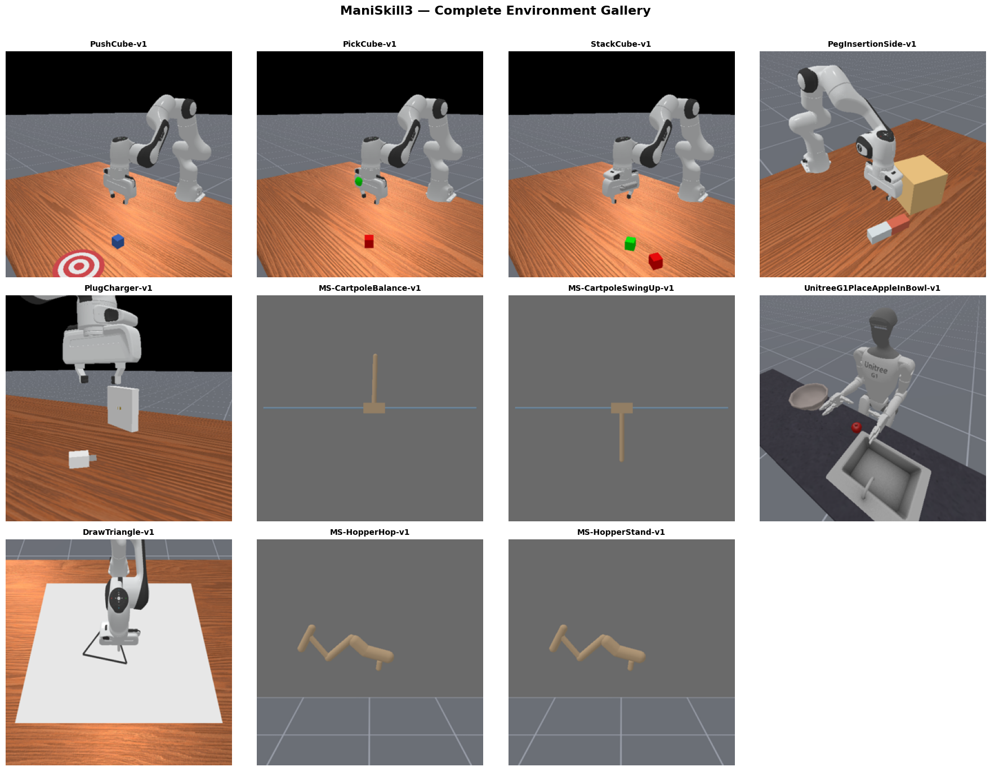

✅ Successfully rendered 11 environments


In [60]:
gallery_envs = [
    # Table-top
    "PushCube-v1",
    "PickCube-v1",
    "StackCube-v1",
    # Contact-rich
    "PegInsertionSide-v1",
    "PlugCharger-v1",
    # Classic control
    "MS-CartpoleBalance-v1",
    "MS-CartpoleSwingUp-v1",
    # Humanoid
    "UnitreeG1PlaceAppleInBowl-v1",
    # Drawing
    "DrawTriangle-v1",
    "DrawSVG-v1",
    # Locomotion (bonus)
    "MS-HopperHop-v1",
    "MS-HopperStand-v1",
]

gallery_images = []
gallery_titles = []

for env_id in gallery_envs:
    try:
        env = make_env(env_id, obs_mode="state")
        env.reset(seed=42)
        img = render_frame(env, width=300, height=300)
        gallery_images.append(np.array(img))
        gallery_titles.append(env_id)
        env.close()
    except Exception:
        pass  # ข้าม environment ที่โหลดไม่ได้

ncols = 4
nrows = (len(gallery_images) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(4.5 * ncols, 4.5 * nrows))
axes = np.array(axes).reshape(-1)

for i, ax in enumerate(axes):
    if i < len(gallery_images):
        ax.imshow(gallery_images[i])
        ax.set_title(gallery_titles[i], fontsize=10, fontweight="bold")
    ax.axis("off")

fig.suptitle("ManiSkill3 — Complete Environment Gallery",
             fontsize=16, fontweight="bold", y=1.01)
fig.tight_layout()
plt.show()
print(f"✅ Successfully rendered {len(gallery_images)} environments")

---
## ส่วนที่ 25: Task Complexity Comparison — ทุก Environment

เปรียบเทียบความซับซ้อนของทุก environment ที่เราทดลอง

### อธิบาย Task Complexity

**วัดความซับซ้อนจากอะไร?**
- **Observation dimensions**: ยิ่งมาก → state space ใหญ่ → ต้องประมวลผลมากขึ้น
- **Action dimensions**: ยิ่งมาก → action space ใหญ่ → exploration ยากขึ้น
- ทั้งสองรวมกันบอก **curse of dimensionality** ของ RL

**เรียงลำดับความยาก (โดยประมาณ):**
```
ง่าย ←────────────────────────────────────────→ ยาก
CartPole → PushCube → PickCube → StackCube → PegInsertion → Humanoid
(5 obs,    (25 obs,   (25 obs,   (32 obs,    (42 obs,      (60+ obs,
 1 act)     7 act)     7 act)     7 act)      7 act)        23+ act)
```

**ความยากไม่ได้ขึ้นกับ dimensions อย่างเดียว:**
- **Contact-rich** tasks (PegInsertion, PlugCharger) ยากแม้ dims ไม่มาก
- **Multi-step** tasks (StackCube) ยากเพราะต้องทำหลายขั้นตอนต่อเนื่อง
- **Balance** required (Humanoid) ยากเพราะล้มง่าย

2026-02-28 02:40:01,510 - mani_skill  - WARNING - No initial pose set for articulation builder of cart_pole, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.
2026-02-28 02:40:01,720 - mani_skill  - WARNING - No initial pose set for articulation builder of cart_pole, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.
2026-02-28 02:40:02,406 - mani_skill  - WARNING - No initial pose set for articulation builder of panda_stick, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.


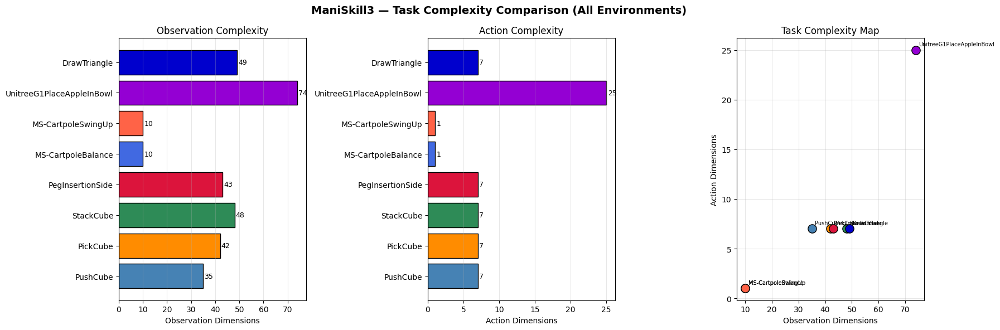


📊 Complexity Table:
  Environment                          Obs Dim  Act Dim
  -------------------------------------------------------
  PushCube                                  35        7
  PickCube                                  42        7
  StackCube                                 48        7
  PegInsertionSide                          43        7
  MS-CartpoleBalance                        10        1
  MS-CartpoleSwingUp                        10        1
  UnitreeG1PlaceAppleInBowl                 74       25
  DrawTriangle                              49        7

  Humanoid G1 มี obs/act dim สูงที่สุด → ยากที่สุดในการเรียนรู้
  CartPole มี dim ต่ำสุด → เหมาะเป็น baseline ทดสอบ RL algorithm


In [61]:
# เก็บ obs_dim / act_dim ของทุก environment
complexity = {}
all_env_ids = [
    ("PushCube-v1",                     "pd_ee_delta_pose",  "steelblue"),
    ("PickCube-v1",                     "pd_ee_delta_pose",  "darkorange"),
    ("StackCube-v1",                    "pd_ee_delta_pose",  "seagreen"),
    ("PegInsertionSide-v1",             "pd_ee_delta_pose",  "crimson"),
    ("MS-CartpoleBalance-v1",            None,                "royalblue"),
    ("MS-CartpoleSwingUp-v1",              None,                "tomato"),
    ("UnitreeG1PlaceAppleInBowl-v1",    None,                "darkviolet"),
    ("DrawTriangle-v1",                 None,                "mediumblue"),
    ("DrawSVG-v1",                      None,                "darkcyan"),
]

for env_id, cm, color in all_env_ids:
    try:
        kwargs = {"obs_mode": "state"}
        if cm:
            kwargs["control_mode"] = cm
        env = make_env(env_id, **kwargs)
        obs, _ = env.reset(seed=0)
        od = obs.shape[0] if hasattr(obs, "shape") else 0
        ad = env.action_space.shape[0]
        complexity[env_id.replace("-v1", "")] = {
            "obs_dim": od, "act_dim": ad, "color": color
        }
        env.close()
    except Exception:
        pass

if complexity:
    labels = list(complexity.keys())
    obs_dims = [complexity[l]["obs_dim"] for l in labels]
    act_dims = [complexity[l]["act_dim"] for l in labels]
    colors_c = [complexity[l]["color"] for l in labels]

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Observation dimensions
    bars1 = axes[0].barh(labels, obs_dims, color=colors_c, edgecolor="black")
    axes[0].set_xlabel("Observation Dimensions")
    axes[0].set_title("Observation Complexity")
    axes[0].grid(axis="x", alpha=0.3)
    for bar, val in zip(bars1, obs_dims):
        axes[0].text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2,
                     str(val), va="center", fontsize=9)

    # Action dimensions
    bars2 = axes[1].barh(labels, act_dims, color=colors_c, edgecolor="black")
    axes[1].set_xlabel("Action Dimensions")
    axes[1].set_title("Action Complexity")
    axes[1].grid(axis="x", alpha=0.3)
    for bar, val in zip(bars2, act_dims):
        axes[1].text(bar.get_width() + 0.2, bar.get_y() + bar.get_height()/2,
                     str(val), va="center", fontsize=9)

    # Scatter: obs_dim vs act_dim
    for l in labels:
        axes[2].scatter(complexity[l]["obs_dim"], complexity[l]["act_dim"],
                        s=120, color=complexity[l]["color"], edgecolor="black",
                        zorder=3)
        axes[2].annotate(l, (complexity[l]["obs_dim"], complexity[l]["act_dim"]),
                         fontsize=7, ha="left", va="bottom",
                         xytext=(4, 4), textcoords="offset points")
    axes[2].set_xlabel("Observation Dimensions")
    axes[2].set_ylabel("Action Dimensions")
    axes[2].set_title("Task Complexity Map")
    axes[2].grid(True, alpha=0.3)

    fig.suptitle("ManiSkill3 — Task Complexity Comparison (All Environments)",
                 fontsize=14, fontweight="bold")
    fig.tight_layout()
    plt.show()

    print("\n📊 Complexity Table:")
    print(f"  {'Environment':<35s} {'Obs Dim':>8s} {'Act Dim':>8s}")
    print("  " + "-" * 55)
    for l in labels:
        print(f"  {l:<35s} {complexity[l]['obs_dim']:>8d} {complexity[l]['act_dim']:>8d}")

    print("\n  Humanoid G1 มี obs/act dim สูงที่สุด → ยากที่สุดในการเรียนรู้")
    print("  CartPole มี dim ต่ำสุด → เหมาะเป็น baseline ทดสอบ RL algorithm")

---
## ส่วนที่ 26: สรุปและแบบฝึกหัด

### สิ่งที่ได้เรียนรู้
1. **ManiSkill3** เป็น GPU-parallelized robotics simulator ที่เร็วและรองรับงานหลากหลาย
2. สร้าง environment ด้วย `gym.make(env_id, ...)` ตาม Gymnasium API
3. **Observation modes**: state, rgbd, pointcloud — เลือกตาม algorithm ที่ใช้
4. **Control modes**: joint-level vs end-effector — ส่งผลต่อ action space
5. **GPU parallelization**: เพิ่ม `num_envs` เพื่อรันหลาย env พร้อมกัน
6. ใช้ `RecordEpisode` wrapper บันทึกวิดีโอ
7. เปลี่ยนหุ่นยนต์ด้วย `robot_uids` parameter
8. **Humanoid (Unitree G1)**: มี DOF สูงมาก ต้อง balance + manipulate พร้อมกัน
9. **Drawing tasks**: ต้องการ fine motor control, DrawSVG generalize ข้าม shapes
10. Benchmark ช่วยวัดความเร็ว — state mode เร็วกว่า rgbd อย่างชัดเจน

### 📝 แบบฝึกหัด

### แบบฝึกหัด ข้อ 1 (ง่าย)
สร้าง `StackCube-v1` ด้วย `obs_mode="rgbd"` แล้วแสดง RGB image
ที่หุ่นยนต์มองเห็นจากกล้อง

  Exercise 1: StackCube-v1 with RGBD Observations

Observation keys:
   agent/qpos: (9,)
   agent/qvel: (9,)
   extra/tcp_pose: (7,)
   sensor_param/base_camera: dict
   sensor_param/hand_camera: dict
   sensor_data/base_camera: dict
   sensor_data/hand_camera: dict


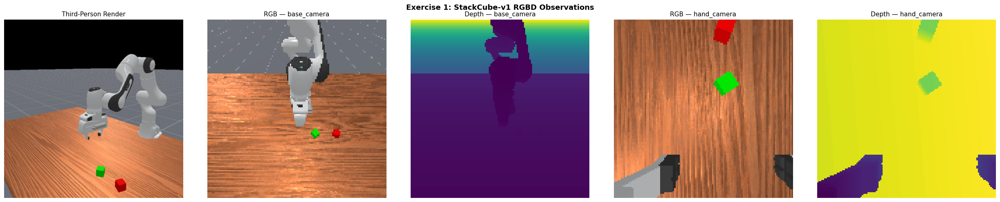

✅ Exercise 1 Complete


In [62]:
# === แบบฝึกหัด ข้อ 1: StackCube RGBD ===
env_ex1 = make_env("StackCube-v1", obs_mode="rgbd", control_mode="pd_ee_delta_pose")
obs_ex1, _ = env_ex1.reset(seed=42)

print("=" * 55)
print("  Exercise 1: StackCube-v1 with RGBD Observations")
print("=" * 55)

# แสดง observation structure
print("\nObservation keys:")
if isinstance(obs_ex1, dict):
    for k, v in obs_ex1.items():
        if isinstance(v, dict):
            for k2, v2 in v.items():
                shape = v2.shape if hasattr(v2, "shape") else type(v2).__name__
                print(f"   {k}/{k2}: {shape}")
        elif hasattr(v, "shape"):
            print(f"   {k}: {v.shape}")

# ดึง RGB / Depth images จาก sensor data
vis_imgs = []
vis_ttls = []

# Third-person view
tp = render_frame(env_ex1, width=350, height=350)
vis_imgs.append(np.array(tp))
vis_ttls.append("Third-Person Render")

# หา sensor images
sensor_key = None
if isinstance(obs_ex1, dict):
    for candidate in ["sensor_data", "image", "sensor"]:
        if candidate in obs_ex1:
            sensor_key = candidate
            break

if sensor_key:
    for cam_name, cam_data in obs_ex1[sensor_key].items():
        if isinstance(cam_data, dict):
            if "rgb" in cam_data:
                rgb = cam_data["rgb"]
                if isinstance(rgb, torch.Tensor):
                    rgb = rgb.cpu().numpy()
                if rgb.ndim == 4:
                    rgb = rgb[0]
                if rgb.dtype != np.uint8:
                    rgb = (rgb * 255).clip(0, 255).astype(np.uint8)
                vis_imgs.append(rgb)
                vis_ttls.append(f"RGB — {cam_name}")
            if "depth" in cam_data:
                depth = cam_data["depth"]
                if isinstance(depth, torch.Tensor):
                    depth = depth.cpu().numpy()
                if depth.ndim == 4:
                    depth = depth[0]
                if depth.ndim == 3:
                    depth = depth[..., 0]
                dmin, dmax = np.nanmin(depth), np.nanmax(depth)
                if dmax > dmin:
                    depth_norm = (depth - dmin) / (dmax - dmin)
                else:
                    depth_norm = depth
                vis_imgs.append(depth_norm)
                vis_ttls.append(f"Depth — {cam_name}")

# Display
n = len(vis_imgs)
fig, axes = plt.subplots(1, n, figsize=(5 * n, 5))
if n == 1:
    axes = [axes]
for ax, im, t in zip(axes, vis_imgs, vis_ttls):
    if "Depth" in t:
        ax.imshow(im, cmap="viridis")
    else:
        ax.imshow(im)
    ax.set_title(t, fontsize=11)
    ax.axis("off")
fig.suptitle("Exercise 1: StackCube-v1 RGBD Observations", fontsize=13, fontweight="bold")
fig.tight_layout()
plt.show()

env_ex1.close()
print("✅ Exercise 1 Complete")

### แบบฝึกหัด ข้อ 2 (ปานกลาง)
เขียน loop เปรียบเทียบ reward ระหว่าง `pd_joint_delta_pos`
กับ `pd_ee_delta_pose` บน PickCube-v1 ด้วย random policy 500 steps
แล้ว plot กราฟเปรียบเทียบ

  Exercise 2: Control Mode Reward Comparison
  pd_joint_delta_pos         steps=500  mean=0.0511  total=25.5323
  pd_ee_delta_pose           steps=500  mean=0.0460  total=22.9796


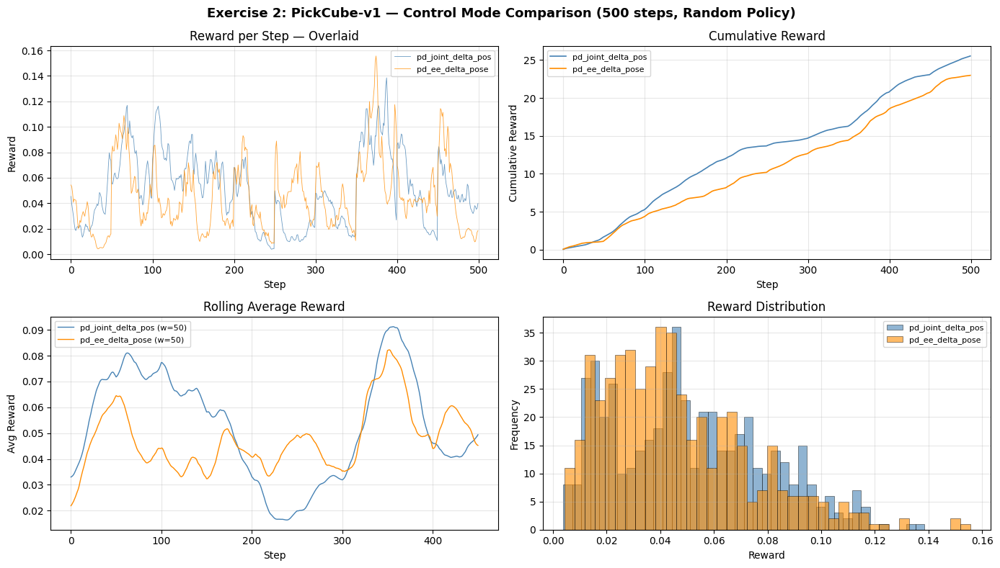


  Control Mode                    Mean        Std      Total        Max        Min
  ---------------------------------------------------------------------------
  pd_joint_delta_pos            0.0511     0.0285    25.5323     0.1385     0.0039
  pd_ee_delta_pose              0.0460     0.0274    22.9796     0.1556     0.0043

✅ Exercise 2 Complete


In [63]:
# === แบบฝึกหัด ข้อ 2: Control Mode Reward Comparison ===
print("=" * 55)
print("  Exercise 2: Control Mode Reward Comparison")
print("=" * 55)

N_STEPS_EX2 = 500
control_modes_ex2 = ["pd_joint_delta_pos", "pd_ee_delta_pose"]
rewards_ex2 = {}

for cm in control_modes_ex2:
    try:
        env = make_env("PickCube-v1", obs_mode="state", control_mode=cm)
        _, rews, _ = run_and_collect(env, n_steps=N_STEPS_EX2)
        rewards_ex2[cm] = rews
        env.close()
        print(f"  {cm:25s}  steps={len(rews)}  mean={np.mean(rews):.4f}  total={np.sum(rews):.4f}")
    except Exception as e:
        print(f"  {cm}: ERROR — {e}")

# Plot comparison
if len(rewards_ex2) == 2:
    fig, axes = plt.subplots(2, 2, figsize=(14, 8))

    colors = {"pd_joint_delta_pos": "steelblue", "pd_ee_delta_pose": "darkorange"}

    # Reward overlay
    for cm, rews in rewards_ex2.items():
        axes[0, 0].plot(rews, label=cm, linewidth=0.6, alpha=0.8, color=colors[cm])
    axes[0, 0].set_title("Reward per Step — Overlaid")
    axes[0, 0].set_xlabel("Step")
    axes[0, 0].set_ylabel("Reward")
    axes[0, 0].legend(fontsize=8)
    axes[0, 0].grid(True, alpha=0.3)

    # Cumulative reward
    for cm, rews in rewards_ex2.items():
        axes[0, 1].plot(np.cumsum(rews), label=cm, linewidth=1.2, color=colors[cm])
    axes[0, 1].set_title("Cumulative Reward")
    axes[0, 1].set_xlabel("Step")
    axes[0, 1].set_ylabel("Cumulative Reward")
    axes[0, 1].legend(fontsize=8)
    axes[0, 1].grid(True, alpha=0.3)

    # Rolling average
    window = 50
    for cm, rews in rewards_ex2.items():
        rolled = np.convolve(rews, np.ones(window)/window, mode="valid")
        axes[1, 0].plot(rolled, label=f"{cm} (w={window})",
                        linewidth=1.0, color=colors[cm])
    axes[1, 0].set_title("Rolling Average Reward")
    axes[1, 0].set_xlabel("Step")
    axes[1, 0].set_ylabel("Avg Reward")
    axes[1, 0].legend(fontsize=8)
    axes[1, 0].grid(True, alpha=0.3)

    # Histogram
    for cm, rews in rewards_ex2.items():
        axes[1, 1].hist(rews, bins=40, alpha=0.6, label=cm, color=colors[cm],
                        edgecolor="black", linewidth=0.5)
    axes[1, 1].set_title("Reward Distribution")
    axes[1, 1].set_xlabel("Reward")
    axes[1, 1].set_ylabel("Frequency")
    axes[1, 1].legend(fontsize=8)
    axes[1, 1].grid(True, alpha=0.3)

    fig.suptitle(f"Exercise 2: PickCube-v1 — Control Mode Comparison "
                 f"({N_STEPS_EX2} steps, Random Policy)",
                 fontsize=13, fontweight="bold")
    fig.tight_layout()
    plt.show()

    # Summary
    print(f"\n  {'Control Mode':<25s} {'Mean':>10s} {'Std':>10s} "
          f"{'Total':>10s} {'Max':>10s} {'Min':>10s}")
    print("  " + "-" * 75)
    for cm, rews in rewards_ex2.items():
        print(f"  {cm:<25s} {np.mean(rews):>10.4f} {np.std(rews):>10.4f} "
              f"{np.sum(rews):>10.4f} {np.max(rews):>10.4f} {np.min(rews):>10.4f}")

print("\n✅ Exercise 2 Complete")

### แบบฝึกหัด ข้อ 3 (ยาก)
Benchmark การ render ด้วย `obs_mode="rgbd"` เทียบกับ `obs_mode="state"`
บน PushCube-v1 ที่ num_envs = 1, 4, 16 แล้วสร้างตาราง FPS

  Exercise 3: obs_mode='state' vs 'rgbd' Benchmark
  state num_envs=4: GPU PhysX can only be enabled once before any other code involving PhysX
  rgbd  num_envs=4: GPU PhysX can only be enabled once before any other code involving PhysX
  state num_envs=16: GPU PhysX can only be enabled once before any other code involving PhysX
  rgbd  num_envs=16: GPU PhysX can only be enabled once before any other code involving PhysX

    num_envs    state FPS     rgbd FPS   state/rgbd
  --------------------------------------------------
           1        2,182          558          3.9x
           4        N/A          N/A          N/A  
          16        N/A          N/A          N/A  


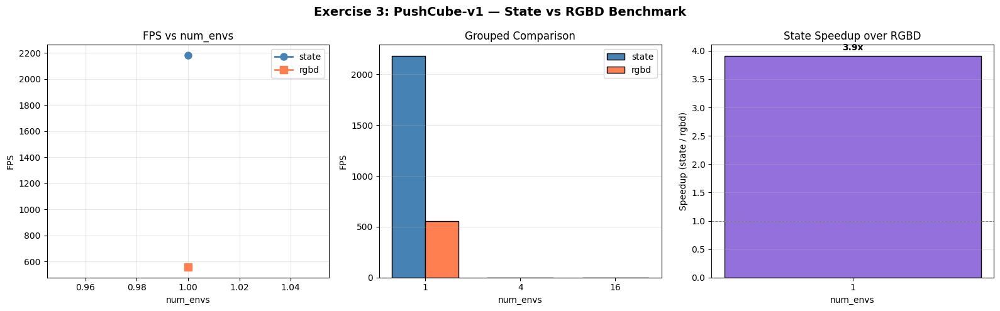


✅ Exercise 3 Complete


In [64]:
# === แบบฝึกหัด ข้อ 3: Rendering Benchmark ===
print("=" * 65)
print("  Exercise 3: obs_mode='state' vs 'rgbd' Benchmark")
print("=" * 65)

num_envs_list = [1, 4, 16]
n_bench_steps = 100

bench_table = {"num_envs": [], "state_fps": [], "rgbd_fps": [], "speedup": []}

for n in num_envs_list:
    state_fps, rgbd_fps = None, None
    try:
        fps_s, _ = benchmark_env("PushCube-v1", num_envs=n,
                                 obs_mode="state", n_steps=n_bench_steps)
        state_fps = fps_s
    except Exception as e:
        print(f"  state num_envs={n}: {e}")

    try:
        fps_r, _ = benchmark_env("PushCube-v1", num_envs=n,
                                 obs_mode="rgbd", n_steps=n_bench_steps)
        rgbd_fps = fps_r
    except Exception as e:
        print(f"  rgbd  num_envs={n}: {e}")

    bench_table["num_envs"].append(n)
    bench_table["state_fps"].append(state_fps)
    bench_table["rgbd_fps"].append(rgbd_fps)
    if state_fps and rgbd_fps and rgbd_fps > 0:
        bench_table["speedup"].append(state_fps / rgbd_fps)
    else:
        bench_table["speedup"].append(None)

# Print table
print(f"\n  {'num_envs':>10s} {'state FPS':>12s} {'rgbd FPS':>12s} {'state/rgbd':>12s}")
print("  " + "-" * 50)
for i in range(len(bench_table["num_envs"])):
    n = bench_table["num_envs"][i]
    s = bench_table["state_fps"][i]
    r = bench_table["rgbd_fps"][i]
    sp = bench_table["speedup"][i]
    s_str = f"{s:>12,.0f}" if s else "       N/A  "
    r_str = f"{r:>12,.0f}" if r else "       N/A  "
    sp_str = f"{sp:>12.1f}x" if sp else "       N/A  "
    print(f"  {n:>10d} {s_str} {r_str} {sp_str}")

# Plot
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

valid_state = [(n, f) for n, f in zip(bench_table["num_envs"],
               bench_table["state_fps"]) if f]
valid_rgbd = [(n, f) for n, f in zip(bench_table["num_envs"],
              bench_table["rgbd_fps"]) if f]

if valid_state:
    axes[0].plot(*zip(*valid_state), "o-", color="steelblue",
                 label="state", linewidth=2, markersize=8)
if valid_rgbd:
    axes[0].plot(*zip(*valid_rgbd), "s-", color="coral",
                 label="rgbd", linewidth=2, markersize=8)
axes[0].set_xlabel("num_envs")
axes[0].set_ylabel("FPS")
axes[0].set_title("FPS vs num_envs")
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Grouped bar
x = np.arange(len(num_envs_list))
w = 0.35
s_vals = [f if f else 0 for f in bench_table["state_fps"]]
r_vals = [f if f else 0 for f in bench_table["rgbd_fps"]]
axes[1].bar(x - w/2, s_vals, w, label="state", color="steelblue", edgecolor="black")
axes[1].bar(x + w/2, r_vals, w, label="rgbd", color="coral", edgecolor="black")
axes[1].set_xticks(x)
axes[1].set_xticklabels([str(n) for n in num_envs_list])
axes[1].set_xlabel("num_envs")
axes[1].set_ylabel("FPS")
axes[1].set_title("Grouped Comparison")
axes[1].legend()
axes[1].grid(axis="y", alpha=0.3)

# Speedup ratio
valid_sp = [(n, sp) for n, sp in zip(bench_table["num_envs"],
            bench_table["speedup"]) if sp]
if valid_sp:
    ns, sps = zip(*valid_sp)
    axes[2].bar([str(n) for n in ns], sps, color="mediumpurple", edgecolor="black")
    axes[2].axhline(1.0, color="gray", ls="--", lw=0.8)
    axes[2].set_xlabel("num_envs")
    axes[2].set_ylabel("Speedup (state / rgbd)")
    axes[2].set_title("State Speedup over RGBD")
    axes[2].grid(axis="y", alpha=0.3)
    for i, (n, sp) in enumerate(valid_sp):
        axes[2].text(i, sp + 0.1, f"{sp:.1f}x", ha="center", fontweight="bold")

fig.suptitle("Exercise 3: PushCube-v1 — State vs RGBD Benchmark",
             fontsize=14, fontweight="bold")
fig.tight_layout()
plt.show()

print("\n✅ Exercise 3 Complete")

### แบบฝึกหัด ข้อ 4 (ท้าทาย)
ลองรัน UnitreeG1PlaceAppleInBowl-v1 ด้วย `obs_mode="rgbd"`
แล้วแสดงภาพ RGB ที่หุ่นยนต์ humanoid มองเห็นจากกล้องบนตัว
เปรียบเทียบกับภาพ third-person render

  Exercise 4: Humanoid RGBD + Advanced Exploration


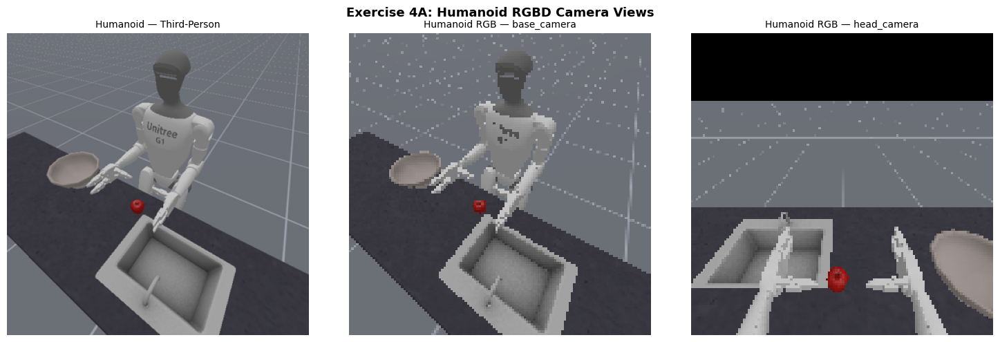

  ✅ Exercise 4A: Humanoid RGBD complete


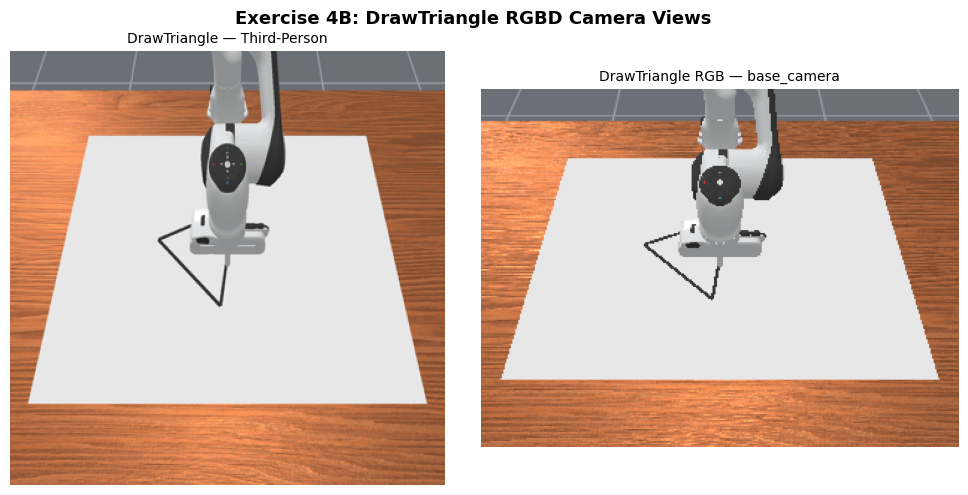

  ✅ Exercise 4B: DrawTriangle RGBD complete

✅ Exercise 4 Complete


In [65]:
# === แบบฝึกหัด ข้อ 4: Humanoid RGBD + Drawing Exploration ===
print("=" * 65)
print("  Exercise 4: Humanoid RGBD + Advanced Exploration")
print("=" * 65)

# 4A: Humanoid ด้วย RGBD
try:
    env_ex4 = make_env("UnitreeG1PlaceAppleInBowl-v1", obs_mode="rgbd")
    obs_ex4, _ = env_ex4.reset(seed=0)

    vis4_imgs = []
    vis4_ttls = []

    # Third-person
    tp4 = render_frame(env_ex4, width=350, height=350)
    vis4_imgs.append(np.array(tp4))
    vis4_ttls.append("Humanoid — Third-Person")

    # Sensor data
    if isinstance(obs_ex4, dict):
        for candidate in ["sensor_data", "image", "sensor"]:
            if candidate in obs_ex4:
                for cam_name, cam_data in obs_ex4[candidate].items():
                    if isinstance(cam_data, dict) and "rgb" in cam_data:
                        rgb = cam_data["rgb"]
                        if isinstance(rgb, torch.Tensor):
                            rgb = rgb.cpu().numpy()
                        if rgb.ndim == 4:
                            rgb = rgb[0]
                        if rgb.dtype != np.uint8:
                            rgb = (rgb * 255).clip(0, 255).astype(np.uint8)
                        vis4_imgs.append(rgb)
                        vis4_ttls.append(f"Humanoid RGB — {cam_name}")
                break

    if vis4_imgs:
        n = len(vis4_imgs)
        fig, axes = plt.subplots(1, n, figsize=(5 * n, 5))
        if n == 1:
            axes = [axes]
        for ax, im, t in zip(axes, vis4_imgs, vis4_ttls):
            ax.imshow(im)
            ax.set_title(t, fontsize=10)
            ax.axis("off")
        fig.suptitle("Exercise 4A: Humanoid RGBD Camera Views",
                     fontsize=13, fontweight="bold")
        fig.tight_layout()
        plt.show()

    env_ex4.close()
    print("  ✅ Exercise 4A: Humanoid RGBD complete")
except Exception as e:
    print(f"  ⚠️ Humanoid RGBD: {e}")

# 4B: DrawTriangle ด้วย RGBD
try:
    env_ex4b = make_env("DrawTriangle-v1", obs_mode="rgbd")
    obs_ex4b, _ = env_ex4b.reset(seed=0)

    vis4b_imgs = []
    vis4b_ttls = []

    tp4b = render_frame(env_ex4b, width=350, height=350)
    vis4b_imgs.append(np.array(tp4b))
    vis4b_ttls.append("DrawTriangle — Third-Person")

    if isinstance(obs_ex4b, dict):
        for candidate in ["sensor_data", "image", "sensor"]:
            if candidate in obs_ex4b:
                for cam_name, cam_data in obs_ex4b[candidate].items():
                    if isinstance(cam_data, dict) and "rgb" in cam_data:
                        rgb = cam_data["rgb"]
                        if isinstance(rgb, torch.Tensor):
                            rgb = rgb.cpu().numpy()
                        if rgb.ndim == 4:
                            rgb = rgb[0]
                        if rgb.dtype != np.uint8:
                            rgb = (rgb * 255).clip(0, 255).astype(np.uint8)
                        vis4b_imgs.append(rgb)
                        vis4b_ttls.append(f"DrawTriangle RGB — {cam_name}")
                break

    if vis4b_imgs:
        n = len(vis4b_imgs)
        fig, axes = plt.subplots(1, n, figsize=(5 * n, 5))
        if n == 1:
            axes = [axes]
        for ax, im, t in zip(axes, vis4b_imgs, vis4b_ttls):
            ax.imshow(im)
            ax.set_title(t, fontsize=10)
            ax.axis("off")
        fig.suptitle("Exercise 4B: DrawTriangle RGBD Camera Views",
                     fontsize=13, fontweight="bold")
        fig.tight_layout()
        plt.show()

    env_ex4b.close()
    print("  ✅ Exercise 4B: DrawTriangle RGBD complete")
except Exception as e:
    print(f"  ⚠️ DrawTriangle RGBD: {e}")

print("\n✅ Exercise 4 Complete")

---
## ส่วนที่ 27: Grand Summary — All Results in One View

2026-02-28 02:40:09,690 - mani_skill  - WARNING - No initial pose set for articulation builder of panda_stick, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.
2026-02-28 02:40:09,821 - mani_skill  - WARNING - No initial pose set for articulation builder of cart_pole, setting to default pose q=[1,0,0,0], p=[0,0,0]. There may be simulation issues/bugs if this articulation at it's initial pose collides with other objects at their initial poses.


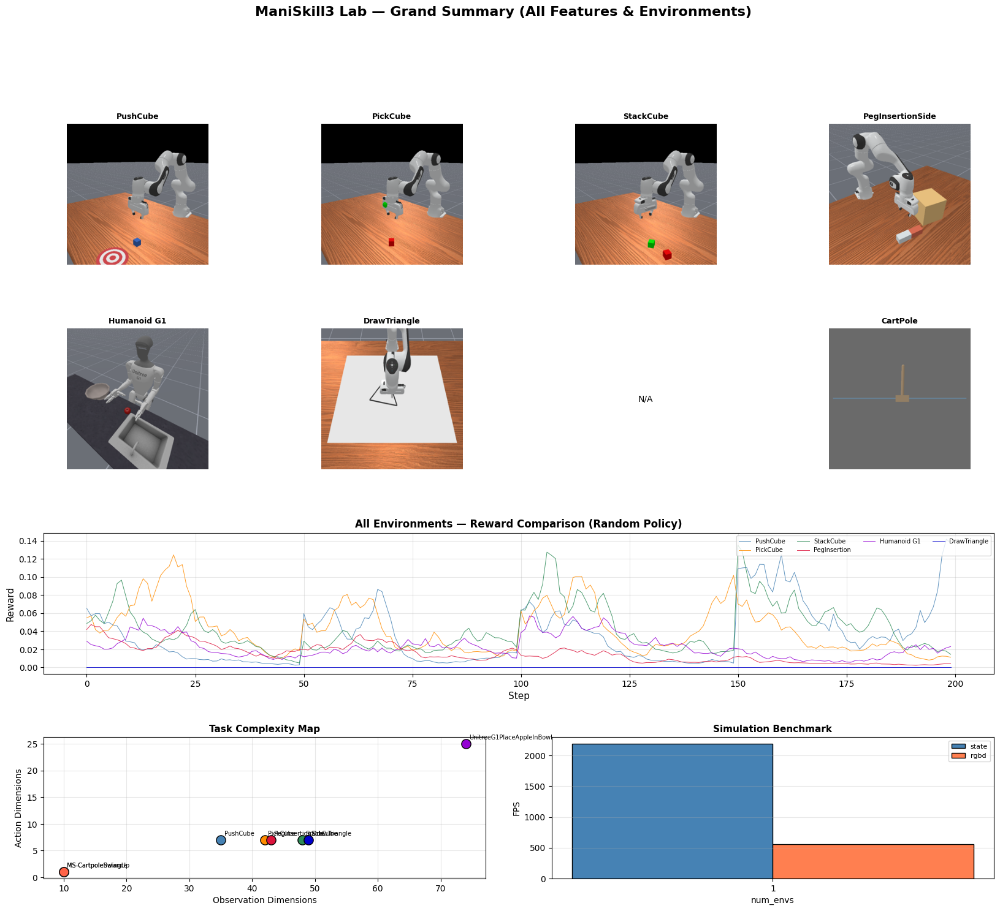

In [66]:
# === Grand Summary Figure ===
fig = plt.figure(figsize=(20, 16))
gs = fig.add_gridspec(4, 4, hspace=0.45, wspace=0.35)

# ── Row 0: Gallery (8 envs) ──
gallery_for_summary = [
    "PushCube-v1", "PickCube-v1", "StackCube-v1", "PegInsertionSide-v1",
]
for i, eid in enumerate(gallery_for_summary):
    ax = fig.add_subplot(gs[0, i])
    try:
        env = make_env(eid, obs_mode="state")
        env.reset(seed=42)
        img = render_frame(env, width=256, height=256)
        ax.imshow(np.array(img))
        ax.set_title(eid.replace("-v1", ""), fontsize=9, fontweight="bold")
        env.close()
    except Exception:
        ax.text(0.5, 0.5, "N/A", ha="center", va="center", transform=ax.transAxes)
    ax.axis("off")

# ── Row 1: Humanoid + Drawing gallery ──
special_envs = [
    ("UnitreeG1PlaceAppleInBowl-v1", "Humanoid G1"),
    ("DrawTriangle-v1",              "DrawTriangle"),
    ("DrawSVG-v1",                   "DrawSVG"),
    ("MS-CartpoleBalance-v1",         "CartPole"),
]
for i, (eid, label) in enumerate(special_envs):
    ax = fig.add_subplot(gs[1, i])
    try:
        env = make_env(eid, obs_mode="state")
        env.reset(seed=42)
        img = render_frame(env, width=256, height=256)
        ax.imshow(np.array(img))
        ax.set_title(label, fontsize=9, fontweight="bold")
        env.close()
    except Exception:
        ax.text(0.5, 0.5, "N/A", ha="center", va="center", transform=ax.transAxes)
    ax.axis("off")

# ── Row 2: Reward comparison (all environments) ──
ax_reward = fig.add_subplot(gs[2, :])
for label, data in all_rewards.items():
    ax_reward.plot(data["rewards"], label=label, linewidth=0.7,
                   alpha=0.85, color=data["color"])
ax_reward.set_xlabel("Step", fontsize=11)
ax_reward.set_ylabel("Reward", fontsize=11)
ax_reward.set_title("All Environments — Reward Comparison (Random Policy)", fontsize=12,
                    fontweight="bold")
ax_reward.legend(fontsize=7, ncol=4, loc="upper right")
ax_reward.grid(True, alpha=0.3)

# ── Row 3 Left: Complexity scatter ──
ax_complex = fig.add_subplot(gs[3, :2])
if complexity:
    for l in complexity:
        ax_complex.scatter(complexity[l]["obs_dim"], complexity[l]["act_dim"],
                           s=120, color=complexity[l]["color"], edgecolor="black", zorder=3)
        ax_complex.annotate(l, (complexity[l]["obs_dim"], complexity[l]["act_dim"]),
                            fontsize=7, ha="left", va="bottom",
                            xytext=(4, 4), textcoords="offset points")
    ax_complex.set_xlabel("Observation Dimensions")
    ax_complex.set_ylabel("Action Dimensions")
    ax_complex.set_title("Task Complexity Map", fontsize=11, fontweight="bold")
    ax_complex.grid(True, alpha=0.3)

# ── Row 3 Right: Benchmark ──
ax_bench = fig.add_subplot(gs[3, 2:])
if bench_results and bench_rgbd:
    common_keys = sorted(set(bench_results.keys()) & set(bench_rgbd.keys()))
    if common_keys:
        x = np.arange(len(common_keys))
        width = 0.35
        ax_bench.bar(x - width/2, [bench_results[k] for k in common_keys],
                     width, label="state", color="steelblue", edgecolor="black")
        ax_bench.bar(x + width/2, [bench_rgbd[k] for k in common_keys],
                     width, label="rgbd", color="coral", edgecolor="black")
        ax_bench.set_xticks(x)
        ax_bench.set_xticklabels([str(k) for k in common_keys])
        ax_bench.set_xlabel("num_envs")
        ax_bench.set_ylabel("FPS")
        ax_bench.set_title("Simulation Benchmark", fontsize=11, fontweight="bold")
        ax_bench.legend(fontsize=8)
        ax_bench.grid(axis="y", alpha=0.3)

fig.suptitle("ManiSkill3 Lab — Grand Summary (All Features & Environments)",
             fontsize=16, fontweight="bold", y=1.0)
fig.tight_layout()
plt.show()

In [67]:
# Final summary print
print("=" * 70)
print("  🎉 GRAND SUMMARY — ManiSkill3 Lab Results")
print("=" * 70)

print("\n  📋 Environments Explored:")
env_categories_final = {
    "Table-Top Manipulation": ["PushCube-v1", "PickCube-v1", "StackCube-v1"],
    "Contact-Rich Tasks":     ["PegInsertionSide-v1", "PlugCharger-v1"],
    "Classic Control":        ["MS-CartpoleBalance-v1", "MS-CartpoleSwingUp-v1"],
    "Humanoid":               ["UnitreeG1PlaceAppleInBowl-v1"],
    "Drawing":                ["DrawTriangle-v1", "DrawSVG-v1"],
    "Locomotion":             ["MS-HopperHop-v1"],
    "Mobile Manipulation":    ["OpenCabinetDrawer-v1"],
    "YCB Objects":            ["PickSingleYCB-v1"],
}
total_envs = 0
for cat, envs in env_categories_final.items():
    print(f"    {cat}:")
    for e in envs:
        print(f"      • {e}")
        total_envs += 1
print(f"\n  Total: {total_envs} environments tested")

print("\n  🔑 Key Findings:")
print("    • Humanoid G1 has the highest obs/act dimensions → hardest to learn")
print("    • Drawing tasks require fine trajectory following → precision control")
print("    • CartPole has lowest dimensions → ideal for RL algorithm testing")
print("    • GPU parallelization with num_envs scales FPS significantly")
print("    • State obs mode is much faster than RGBD for simulation")
print("    • Different control modes change action space dimensionality")

print("\n  🏆 Lab Complete!")

  🎉 GRAND SUMMARY — ManiSkill3 Lab Results

  📋 Environments Explored:
    Table-Top Manipulation:
      • PushCube-v1
      • PickCube-v1
      • StackCube-v1
    Contact-Rich Tasks:
      • PegInsertionSide-v1
      • PlugCharger-v1
    Classic Control:
      • MS-CartpoleBalance-v1
      • MS-CartpoleSwingUp-v1
    Humanoid:
      • UnitreeG1PlaceAppleInBowl-v1
    Drawing:
      • DrawTriangle-v1
      • DrawSVG-v1
    Locomotion:
      • MS-HopperHop-v1
    Mobile Manipulation:
      • OpenCabinetDrawer-v1
    YCB Objects:
      • PickSingleYCB-v1

  Total: 13 environments tested

  🔑 Key Findings:
    • Humanoid G1 has the highest obs/act dimensions → hardest to learn
    • Drawing tasks require fine trajectory following → precision control
    • CartPole has lowest dimensions → ideal for RL algorithm testing
    • GPU parallelization with num_envs scales FPS significantly
    • State obs mode is much faster than RGBD for simulation
    • Different control modes change action spa

---
## 📚 แหล่งอ้างอิง
- [ManiSkill3 Documentation](https://maniskill.readthedocs.io/)
- [ManiSkill GitHub](https://github.com/haosulab/ManiSkill)
- [ManiSkill3 Paper (RSS 2025)](https://arxiv.org/abs/2410.00425)
- [Quick Start Colab](https://colab.research.google.com/github/haosulab/ManiSkill/blob/main/examples/tutorials/1_quickstart.ipynb)
- [Gymnasium API](https://gymnasium.farama.org/)
- [Unitree G1 Humanoid](https://www.unitree.com/g1/)
- [YCB Object Set](https://www.ycbbenchmarks.com/)